# Plot beam properties from drift scan maps

map properties:

small maps are 40 x 40 pixels

call size = 100 arc sec

In [2]:
import os
from astropy.io import fits
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import gridspec
import matplotlib.pyplot as plt
from reproject import reproject_interp
from astropy.modeling import models, fitting
import csv
from astropy.io import ascii

mpl.rcParams['font.family'] = 'serif'
%matplotlib inline
mpl.rcParams['font.size'] = '20'
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

%matplotlib inline

def reject_outliers(data, m):
    return data[abs(data - np.mean(data)) < m * np.std(data)]

In [7]:
date = '190912'
date2 = '190722'
#beam = 1
def compare_times(date, date2):
    beams_1 = []
    beams_2 = []

    for beam in range(0,40):
        hdulist = fits.open('/tank/denes/drift_scan/{}/cube2/{}_{:02}_I_model_reg.fits'.format(date, date, beam))
        data_1 = hdulist[0].data

        hdulist = fits.open('/tank/denes/drift_scan/{}/cube2/{}_{:02}_I_model_reg.fits'.format(date2, date2, beam))
        data_2 = hdulist[0].data

        beams_1 = np.append( beams_1, data_1)
        beams_2 = np.append(beams_2, data_2)

    fig = plt.figure(figsize=(6.,5.))
    plt.axes(frameon=False)
    plt.xticks([])
    plt.yticks([])

    ax = fig.add_subplot(1,1,1)
    d = np.ndarray.flatten(beams_1)-np.ndarray.flatten(beams_2)
    bin_size = 20
    plt.hist(d, bins=bin_size, histtype='step', color='C0', fill=True, linewidth=2, density=True)
    plt.xticks(family='serif',size=18)
    plt.yticks(family='serif',size=18)
    #ax.set_ybound(0, 20)
    ax.set_xlabel('{}-{}'.format(date, date2), size=20,family='serif')
    ax.set_ylabel('N', size=20,family='serif')

    plt.tight_layout()
    #P.show()
    plt.savefig('/tank/denes/drift_scan/plots/{}-{}_histogram.png'.format(date, date2), bbox_inches="tight", dpi=200)    

    print('average, rms {}-{}:'.format(date, date2), np.average(np.nan_to_num(d)), np.sqrt(np.average(np.square(np.nan_to_num(d)))))

/home/apercal/pipeline/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/apercal/pipeline/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


average, rms 190912-190821: 0.00029742706550139636 0.013932179778368177


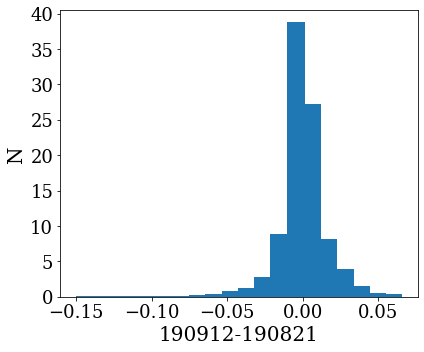

In [8]:
compare_times('190912', '190821')

NameError: name 'data_1' is not defined

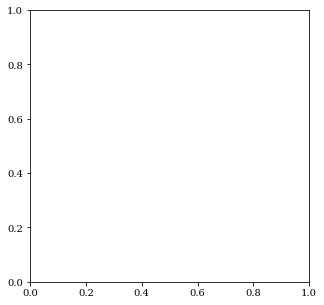

In [9]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
plt.plot(data_1, data_2, marker='o', color='C0')
ax.set_xlabel('pixel', size=20)
ax.set_ylabel('pixel', size=20)
#plt.xlim(0,661)
#plt.ylim(0,661)
plt.show

NameError: name 'beams_1' is not defined

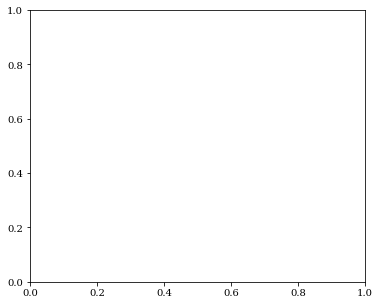

In [10]:
fig = plt.figure(figsize=(6.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

ax = fig.add_subplot(1,1,1)
d = np.ndarray.flatten(beams_1)-np.ndarray.flatten(beams_2)
bin_size = 20
plt.hist(d, bins=bin_size, histtype='step', color='C0', fill=True, linewidth=2, density=True)
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('time1-time2', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')

plt.tight_layout()
#P.show()
plt.savefig('/tank/denes/drift_scan/plots/histogram.png')

In [ ]:
np.average(np.nan_to_num(d))

In [ ]:
np.sqrt(np.average(np.square(np.nan_to_num(d))))

# Fit 2D Gaussian to beams

-9.727903697452549
-197.3835522424254
-119.2527088309708
216.74544467202315
110.32133139903706
-6.157067243129307
300.6974532717052
8.892387510186275
-10.440675486416634
-209.68005730293146
218.39708713657203
12.229093692919324
-56.43641303884997
21.327693882504253
107.53604991241211
-7.511783151701416
-17.460164840085497
-215.9549451552543
119.13333376526168
168.89271811021763
3.7739777638792167
0.13031501663045192
-4.110010473387737
-398.8912285682139
-110.04221755175924
-107.11459270258456
-13.577463341445307
13.784858206336704
322.2093129954524
2.64067223274643
7.383144708798905
-214.56442213172974
-16.873597149742885
107.1396943932939
-118.20521248518945
-10.333593638431541
2.2685395309908554
201.45030173241994
-401.5050663720694
-16.48814403970096


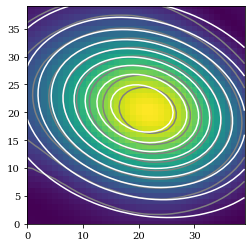

In [2]:
date = '190912'
beam = 1

fwhm_x = []
fwhm_y = []
fwhm_av = []
ang = []
cent_x = []
cent_y = []

for beam in range(0,40):
    av = []
    x = []
    y = []
    ang1 = []
    for chan in range(1,2):
        hdulist = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_{}/{}_{:02}_I_model.fits'.format(date, chan, date, beam))
        #hdulist = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_{}/{}_{:02}_I_model.fits'.format(date, chan, date, beam))
        data = hdulist[0].data
        h = hdulist[0].header
        data = np.nan_to_num(data)

        med = np.median(data) 
        # data = data - med
        # data = data[0,0,:,:] # NOT SURE THIS IS NEEDED!

        fit_w = fitting.LevMarLSQFitter()

        y0, x0 = np.unravel_index(np.argmax(data), data.shape)
        sigma = np.std(data)
        amp = np.max(data)

        w = models.Gaussian2D(amp, x0, y0, sigma, sigma)
        yi, xi = np.indices(data.shape)
        g = fit_w(w, xi, yi, data)
        #print(np.rad2deg(g.theta.value))
        #print(g.x_fwhm*abs(h['CDELT1'])*60, g.y_fwhm*abs(h['CDELT1'])*60)
        model_data = g(xi, yi)
        
        x = np.append(x, g.x_fwhm*abs(h['CDELT1'])*60)
        y = np.append(y, g.y_fwhm*abs(h['CDELT1'])*60)
        av = np.append(av, (g.x_fwhm*abs(h['CDELT1'])*60 + g.y_fwhm*abs(h['CDELT1'])*60)/2)
        ang1 = np.append(ang1, np.rad2deg(g.theta))

    fwhm_x.append(x)
    fwhm_y.append(y)
    fwhm_av.append(av)
    ang.append(ang1)
    cent_x.append(x0)
    cent_y.append(y0)
    

fig, ax = plt.subplots()
ax.imshow(data, label='Gaussian') 
ax.contour(data, levels=np.arange(0.1,1,0.1), colors='grey') 
ax.contour(model_data, levels=np.arange(0.1,1,0.1), colors='w') 
plt.xlim(0,39)
plt.ylim(0,39)
plt.show()

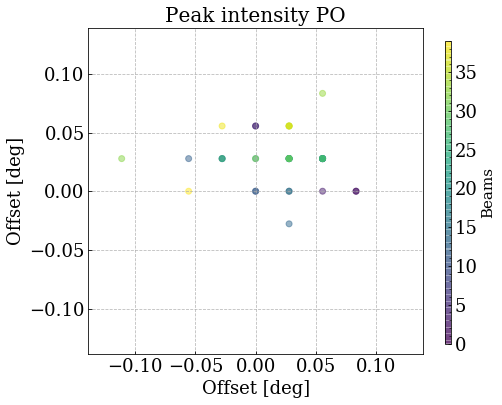

In [20]:
cent_x = np.array(cent_x)
cent_y = np.array(cent_y)

fig = plt.figure( figsize=(6,6))
ax = fig.add_subplot(111)
plt.title('Peak intensity PO', fontsize=20)
plt.grid(linestyle='--', color='darkgrey', alpha=0.8)

cb = plt.scatter((20-cent_x)*(100. / 3600.), (20-cent_y)*(100. / 3600.), c=range(40), cmap='viridis', alpha=0.5)
    
ax.set_xlim(-5*(100. / 3600.),5*(100. / 3600.))
ax.set_ylim(-5*(100. / 3600.),5*(100. / 3600.))
ax.set_xlabel('Offset [deg]', size=18)
ax.set_ylabel('Offset [deg]', size=18)
ax.tick_params(axis='both', which='major', labelsize=18)

cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
cbar =fig.colorbar(cb, cax=cbar_ax)
cbar.minorticks_on()
cbar.set_label('Beams', size=15)
cbar.ax.tick_params(labelsize=18) 

plt.savefig('/tank/denes/drift_scan/plots/{}_beam_po_offset.png'.format(date), bbox_inches="tight", dpi=200)    


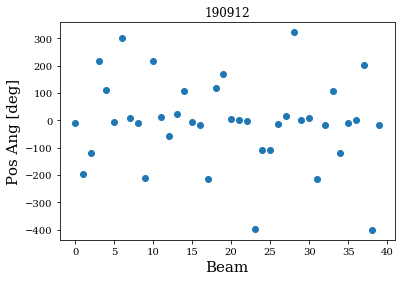

In [29]:
def beam_angle_plot(angle):
    fig, ax = plt.subplots()
    ax.set_title(date)
    b = np.arange(0,40)
    plt.scatter(b, ang, label='angle')
    ax.set_xlabel('Beam', size=15)
    ax.set_ylabel('Pos Ang [deg]', size=15)
    #ax.set_ylim(30,50)
    #plt.legend()
    plt.savefig('/tank/denes/drift_scan/plots/{}_beam_angle.png'.format(date), bbox_inches="tight", dpi=200)    

beam_angle_plot(ang)

In [ ]:

fig, ax = plt.subplots()
for i in range(0,40):
    plt.plot(np.arange(1,10), fwhm_av[i], alpha=0.5, color='grey')
plt.plot(np.arange(1,10), np.average(fwhm_av, axis=0), color='k')
ax.set_title(date)

ax.set_xlabel('Frequency bin', size=15)
ax.set_ylabel('FWHM [\']', size=15)
plt.savefig('/tank/denes/drift_scan/plots/{}_FWHM_freq.png'.format(date, date2), bbox_inches="tight", dpi=200)    


In [ ]:
def beam_size_plot(fwhm_x, fwhm_y, fwhm_av):
    fig, ax = plt.subplots()
    ax.set_title(date)
    b = np.arange(0,40)
    plt.plot(b, fwhm_x, alpha=0.5, label='FWHM$_x$', color='C0')
    plt.plot(b, fwhm_y, alpha=0.5, label='FWHM$_y$', color='C1')
    plt.plot(b, fwhm_av, label='FWHM$_{av}$', color='k')
    ax.set_xlabel('Beam', size=15)
    ax.set_ylabel('FWHM [\']', size=15)
    ax.set_ylim(30,50)
    #plt.legend()
    plt.savefig('/tank/denes/drift_scan/plots/{}_FWHM.png'.format(date, date2), bbox_inches="tight", dpi=200)    

beam_size_plot(fwhm_x, fwhm_y, fwhm_av)

# Compare FWHM at different dates

In [4]:
# Fit a 2D gaussian and write data into csv file

date = '190912'
pol= 'xx'
freq = '7'

def fit_fwhm(date, pol, freq):
    #fwhm_x = []
    #fwhm_y = []
    #fwhm_av = []
    #ang = []

    with open('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_{}_{}.csv'.format(date, date, pol, freq), mode='w') as fwhm_file:
        fwhm_writer = csv.writer(fwhm_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        fwhm_writer.writerow(['Beam', 'FWHM_x', 'FWHM_y', 'FWHM_av', 'pos_angle', 'x_0', 'y_0'])

        for beam in range(0,40):
            hdulist = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_{}/{}_{:02}_{}_model.fits'.format(date, freq, date, beam, pol))
            data = hdulist[0].data
            h = hdulist[0].header
            data = np.nan_to_num(data)

            med = np.median(data) 
            # data = data - med
            # data = data[0,0,:,:] # NOT SURE THIS IS NEEDED!

            fit_w = fitting.LevMarLSQFitter()

            y0, x0 = np.unravel_index(np.argmax(data), data.shape)
            sigma = np.std(data)
            amp = np.max(data)

            w = models.Gaussian2D(amp, x0, y0, sigma, sigma)
            yi, xi = np.indices(data.shape)
            g = fit_w(w, xi, yi, data)
            #print(g.x_fwhm*abs(h['CDELT1'])*60, g.y_fwhm*abs(h['CDELT1'])*60)
            model_data = g(xi, yi)

            #fwhm_x.append(g.x_fwhm*abs(h['CDELT1'])*60)
            #fwhm_y.append(g.y_fwhm*abs(h['CDELT1'])*60)
            #fwhm_av.append((g.x_fwhm*abs(h['CDELT1'])*60 + g.y_fwhm*abs(h['CDELT1'])*60)/2)

            fwhm_writer.writerow([beam, g.x_fwhm*abs(h['CDELT1'])*60, g.y_fwhm*abs(h['CDELT1'])*60, (g.x_fwhm*abs(h['CDELT1'])*60 + g.y_fwhm*abs(h['CDELT1'])*60)/2, (g.theta * (180 / np.pi)), x0, y0] )


In [ ]:
# creat csv tables with the 2D Gaussian fitted beam parameters
# loop trough all dates and frequencies

#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201218', '210205', '201028']

#dates = ['201028', '201218']

pol= 'I'
freq = '9'

for freq in range(1,10):
    for date in dates:
        fit_fwhm(date, pol, freq)
        print(date)

190628
190722
190821
190826
190912
190916
190918
191008
191023
191026
191120
200130
200430
200710
200819
201009
201218
210205
201028
190628
190722
190821
190826
190912
190916
190918
191008
191023
191026
191120
200130
200430
200710
200819
201009
201218
210205
201028
190628
190722
190821
190826
190912
190916
190918
191008
191023
191026


## Make plots

/home/apercal/pipeline/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


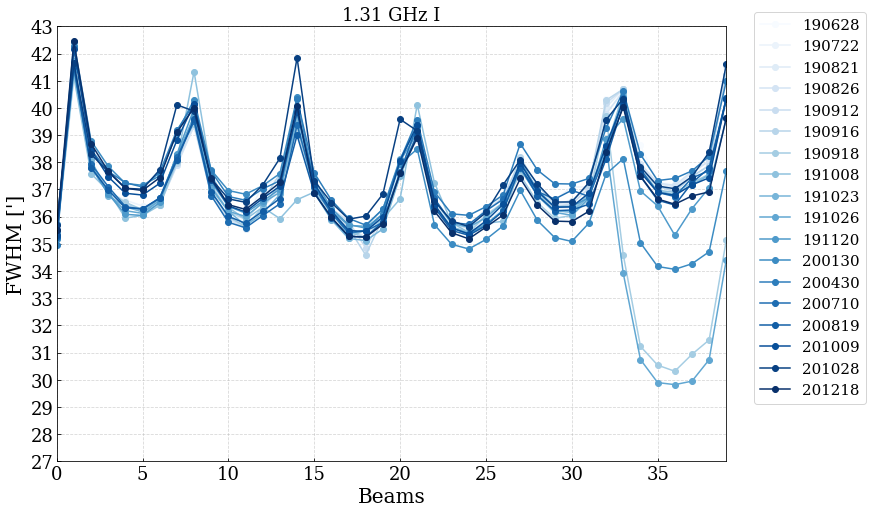

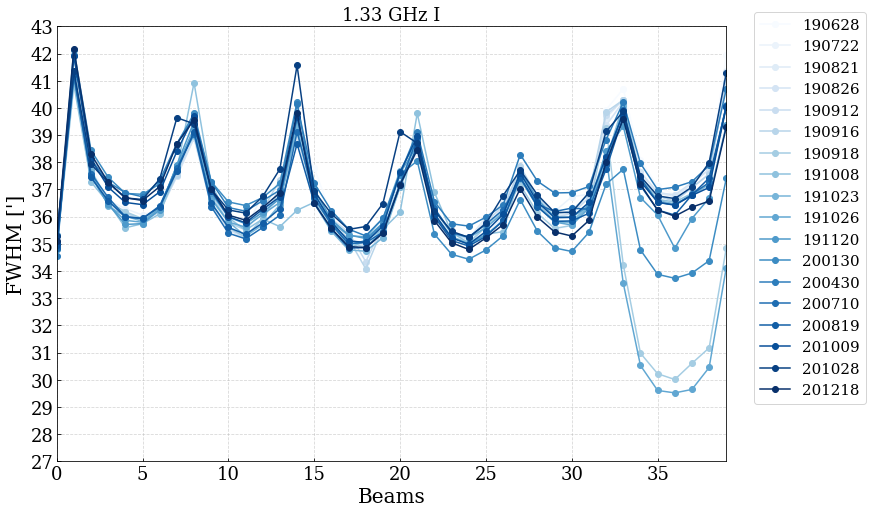

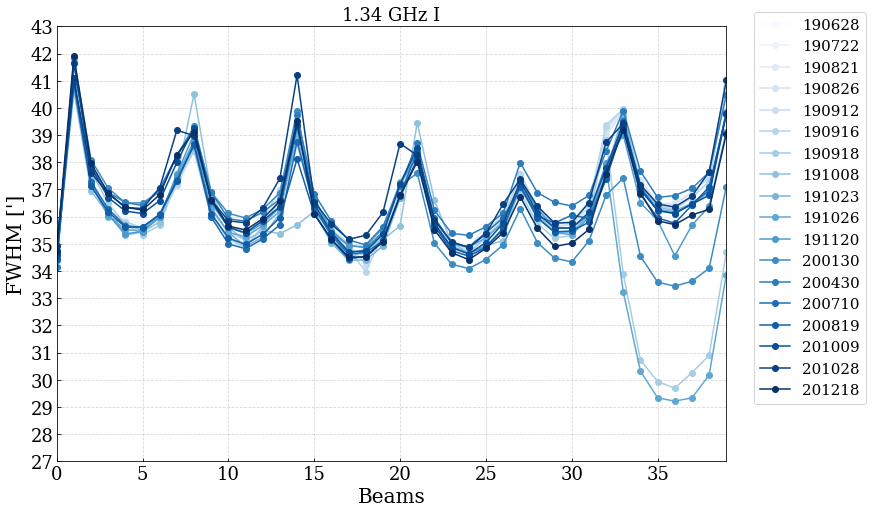

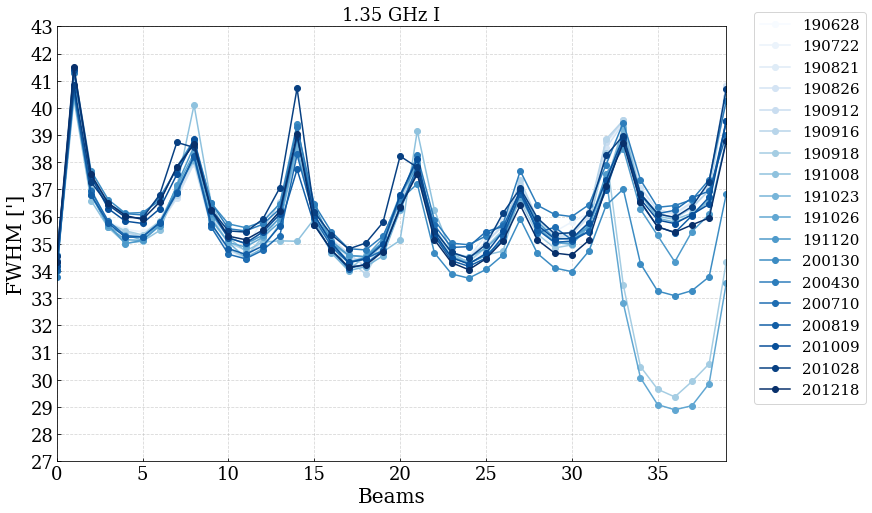

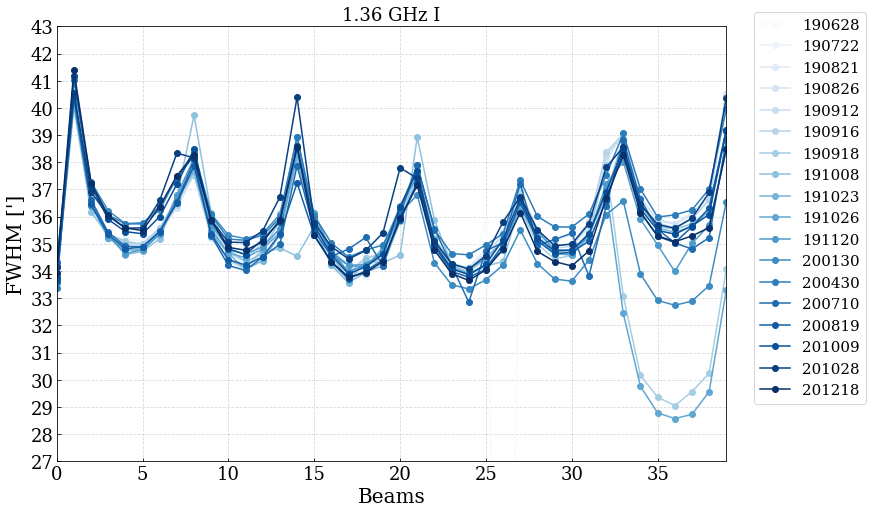

...

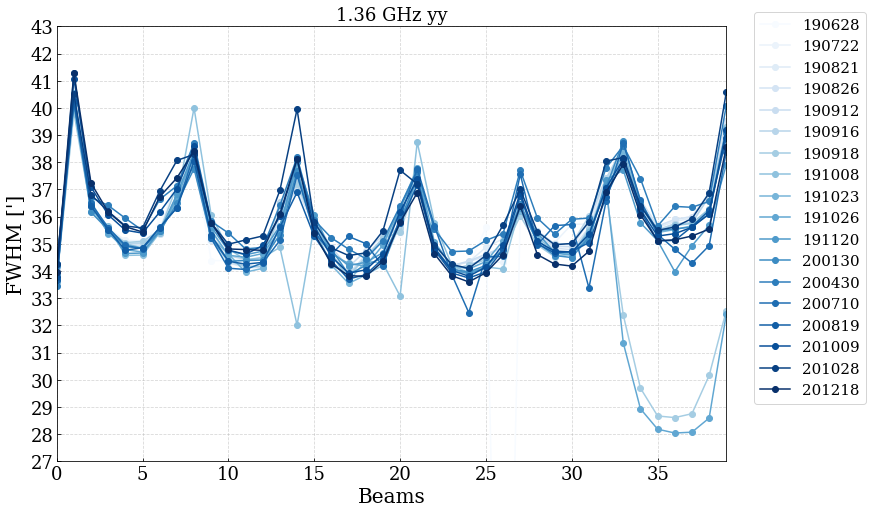

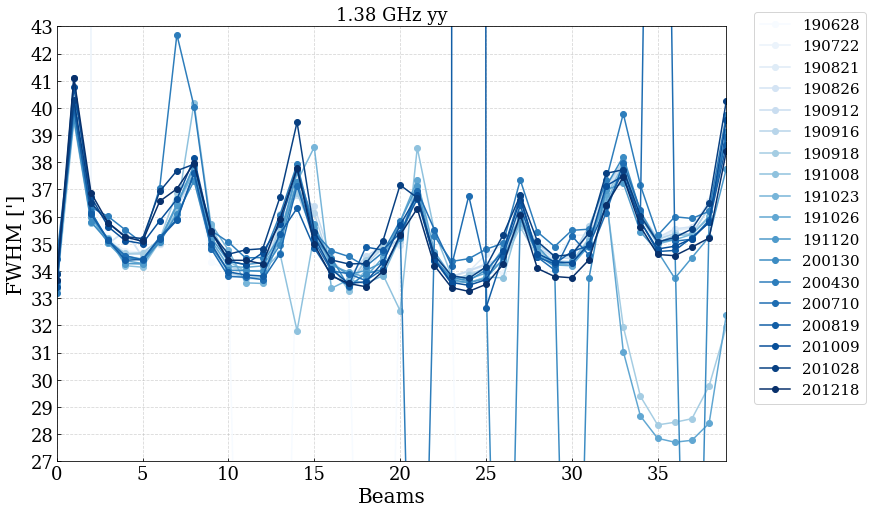

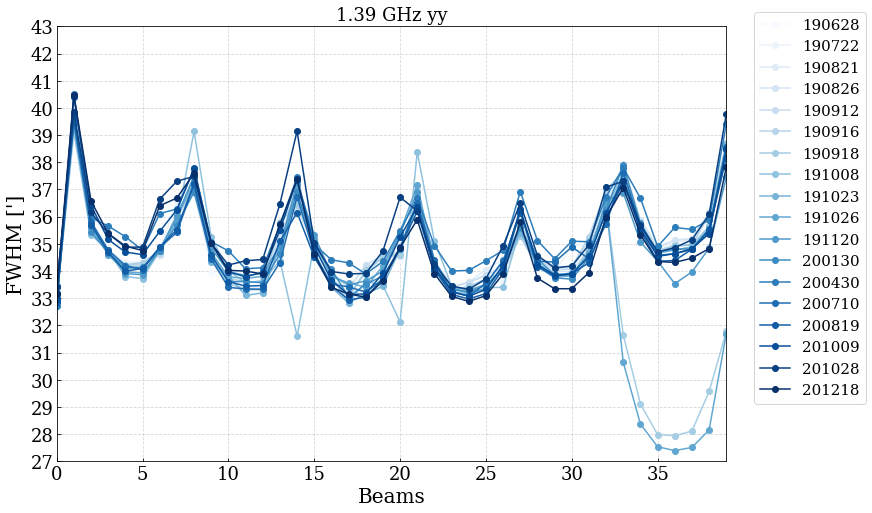

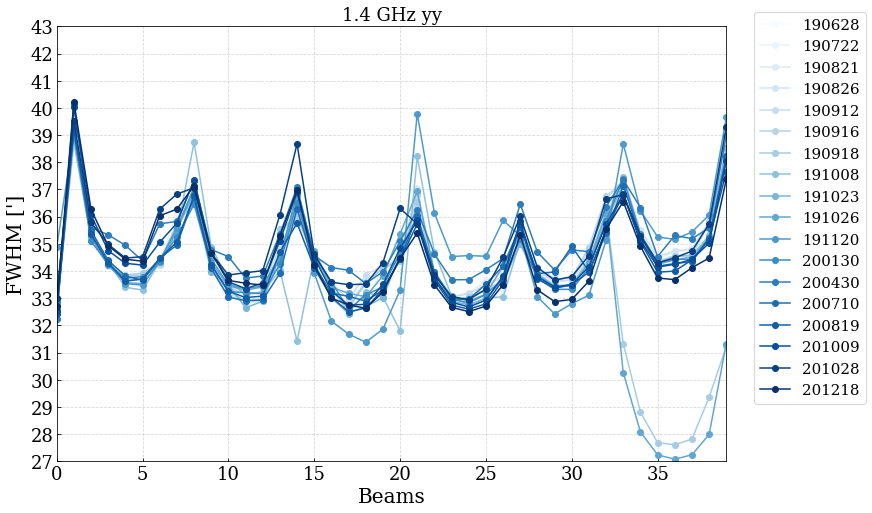

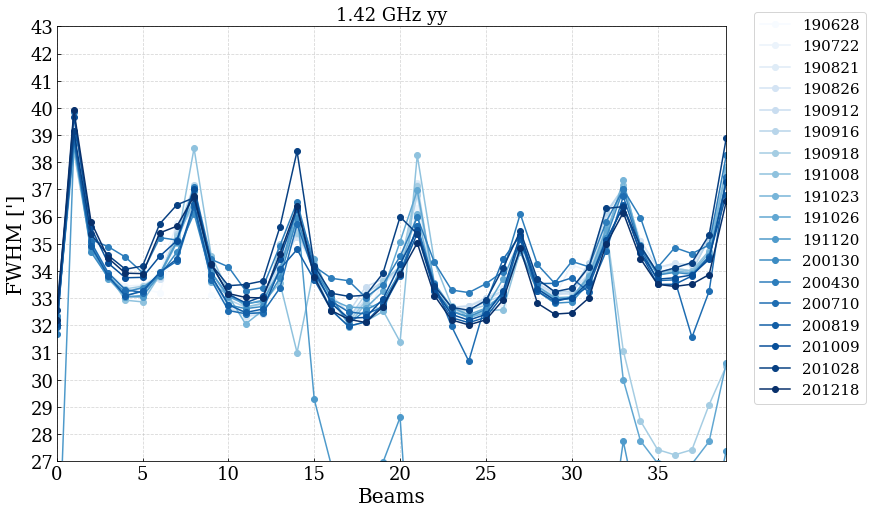

In [12]:
# plot FWHM for all beams at different dates
# loop troug all frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '191008', '191023', '191120', '200130', '200430', '200710', '200819', '201009']
freq = '5'

freq_label = []
CRVAL3_new = 1280e6+(12.207e3*(-(24576/2-14000)))  #rewrite to this
CDELT3_new = 12.207e3*1050
for i in range(0,10):
    freq_label.append(CRVAL3_new+(i*CDELT3_new))
    
#freq_label = np.array([1234867750.0, 1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0, 1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0])
freq_label = np.array(freq_label)
freq_label_gh = np.round(freq_label/1e9,2)

n = len(dates)
colors = mpl.cm.Blues(np.linspace(0,1,n))

for pol in ['I', 'xx', 'yy']:
    for freq in range(1,10):
        fig = plt.figure( figsize=(12, 8))
        ax = fig.add_subplot(111)
        ax.set_title('{} GHz {}'.format(freq_label_gh[freq], pol), fontsize=18)
        for i in range(len(dates)):
            data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_{}_{}.csv'.format(dates[i], dates[i], pol, freq), format='csv', fast_reader=False)

            ax.plot(range(40), data['FWHM_av'], marker='o', label=dates[i], color=colors[i])

        ax.set_ylabel('FWHM [\']', fontsize=20)
        ax.set_xlabel('Beams', fontsize=20)
        ax.set_xlim(0,39)
        ax.set_ylim(27,43)
        ax.set_xticks(range(0,40,5))
        ax.set_yticks(range(27,44))
        ax.tick_params(axis='both', which='major', labelsize=18)
        plt.grid(linestyle='--', alpha=0.5)
        ax.legend(bbox_to_anchor=(1.03, 1.05), fontsize=15) 
        plt.savefig('/tank/denes/drift_scan/plots/FWHMs_{}_chan_{}.png'.format(pol, freq), bbox_inches="tight", dpi=200)


/home/apercal/pipeline/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


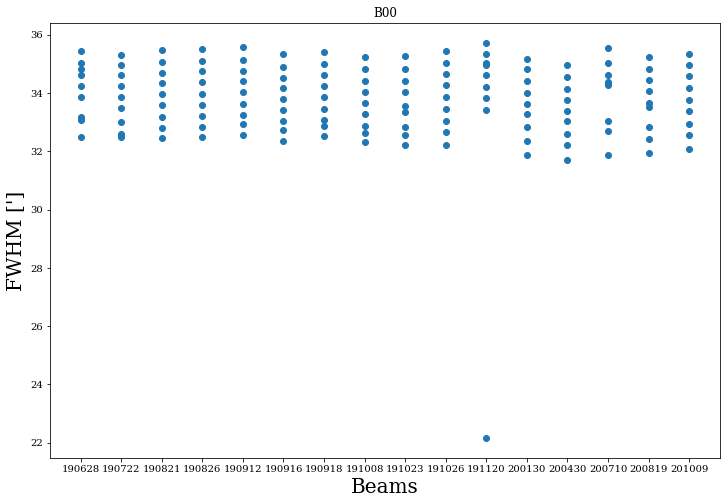

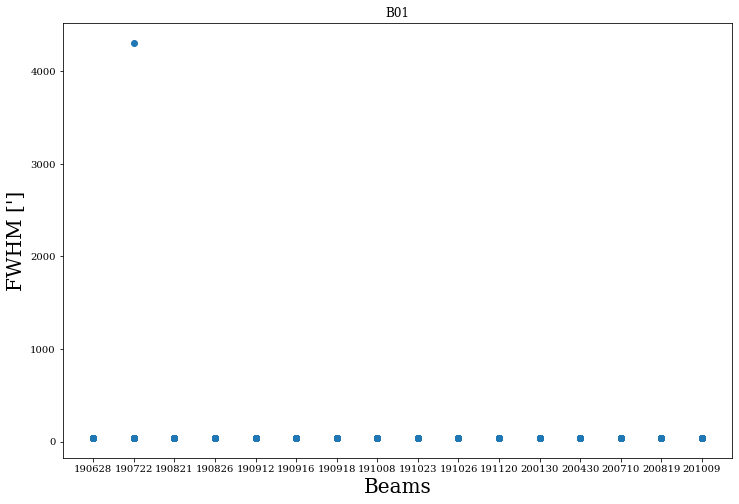

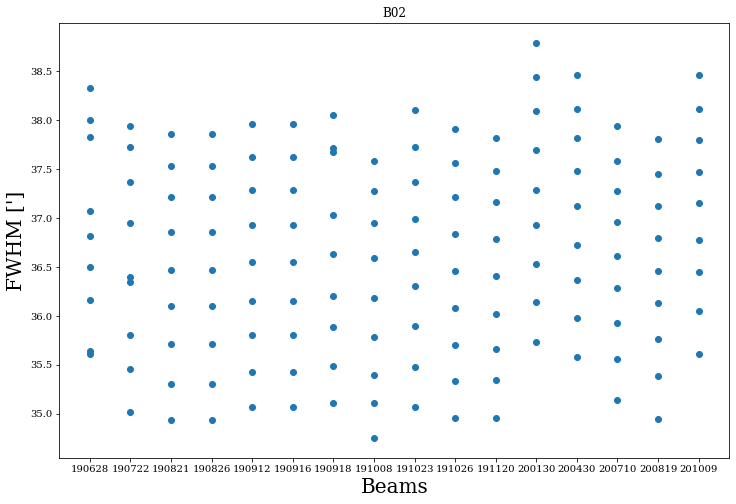

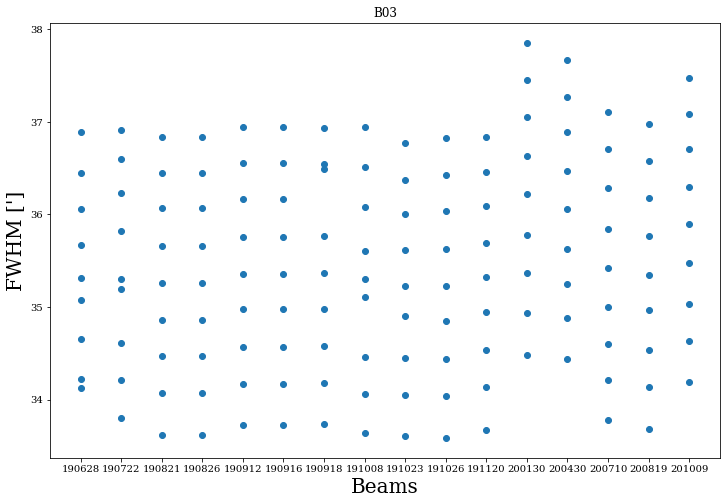

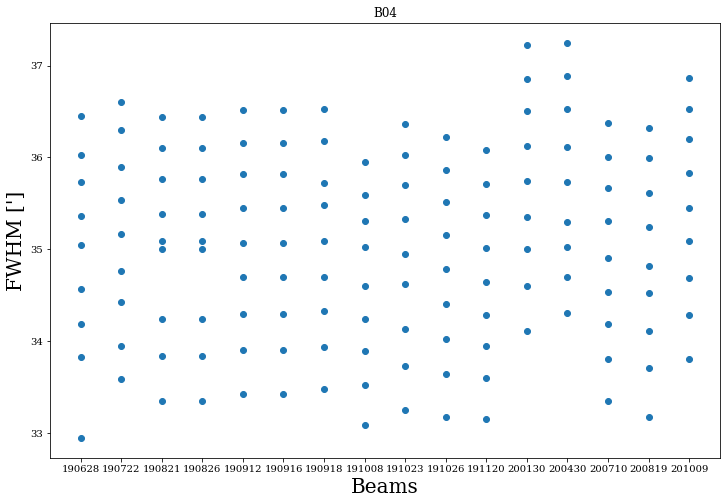

...

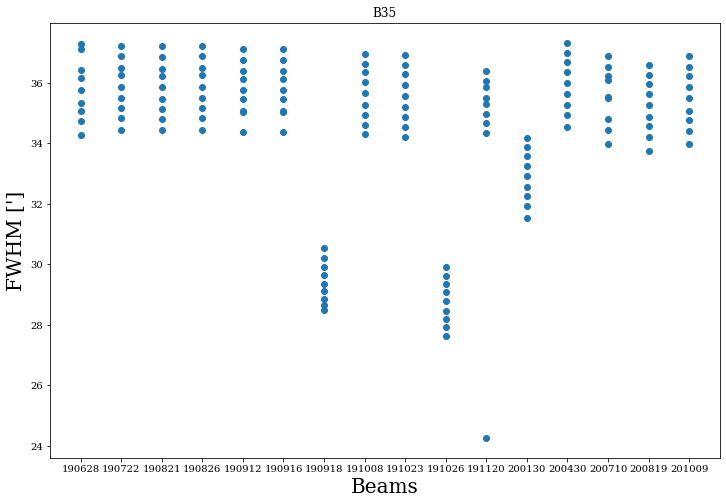

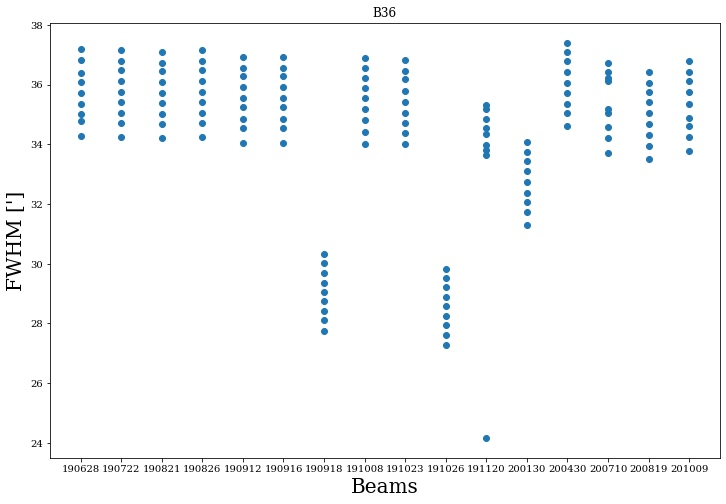

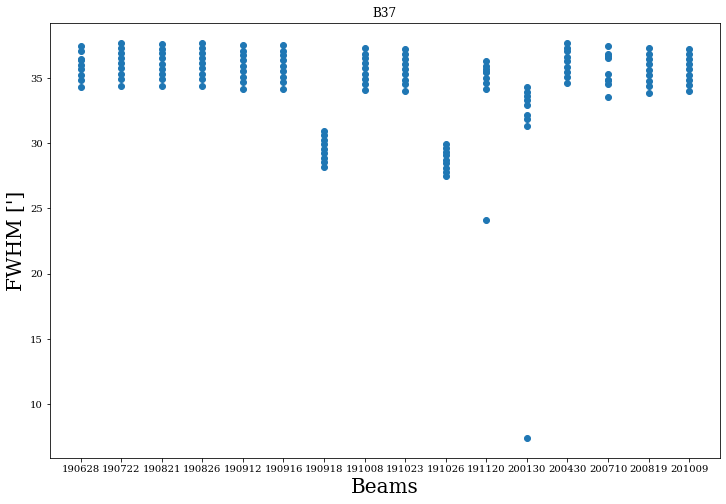

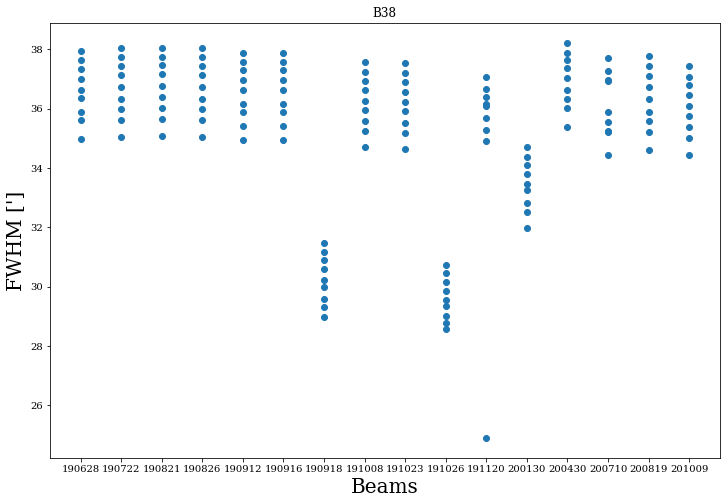

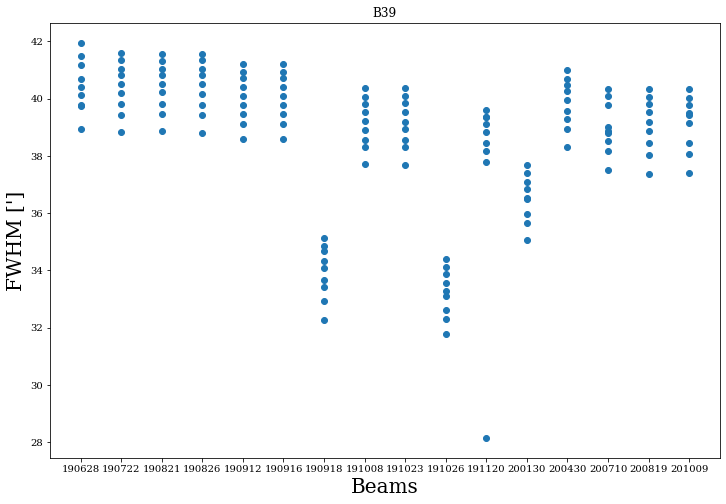

In [22]:
# plot FWHM for all beams at different dates
# loop troug all frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '191008', '191023', '191120', '200130', '200430', '200710', '200819', '201009']
beam = 24

for beam in range(0,40):
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(111)

    for freq in range(1,10):

        ax.set_title('B{:02}'.format(beam))
        for date in dates:
            data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)

            ax.plot(date, data['FWHM_av'][beam], marker='o', color='C0', label=date)

        ax.set_ylabel('FWHM [\']', fontsize=20)
        ax.set_xlabel('Beams', fontsize=20)
        #ax.set_ylim(25,50)
        #ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.savefig('/tank/denes/drift_scan/plots/FWHMs_B{:02}.png'.format(beam), bbox_inches="tight", dpi=200)


0 average FWHM: 33.87 0.23
1 average FWHM: 40.41 0.39
2 average FWHM: 36.63 0.29
3 average FWHM: 35.46 0.3
4 average FWHM: 35.07 0.31
5 average FWHM: 35.03 0.3
6 average FWHM: 35.63 0.4
7 average FWHM: 36.8 0.5
8 average FWHM: 38.0 0.5
9 average FWHM: 35.58 0.29
10 average FWHM: 34.63 0.25
11 average FWHM: 34.39 0.32
12 average FWHM: 34.9 0.32
13 average FWHM: 35.67 0.43
14 average FWHM: 38.13 1.06
15 average FWHM: 35.69 0.25
16 average FWHM: 34.55 0.2
17 average FWHM: 34.03 0.31
18 average FWHM: 34.27 0.37
19 average FWHM: 34.61 0.29
20 average FWHM: 36.09 0.56
21 average FWHM: 37.59 0.4
22 average FWHM: 35.11 0.28
23 average FWHM: 34.17 0.15
24 average FWHM: 33.94 0.32
25 average FWHM: 34.51 0.41
26 average FWHM: 33.5 6.49
27 average FWHM: 36.63 0.32
28 average FWHM: 35.26 0.27
29 average FWHM: 34.78 0.29
30 average FWHM: 34.82 0.35
31 average FWHM: 35.35 0.47
32 average FWHM: 37.42 0.67
33 average FWHM: 38.1 1.92
34 average FWHM: 35.75 2.06
35 average FWHM: 34.9 2.08
36 average FWHM

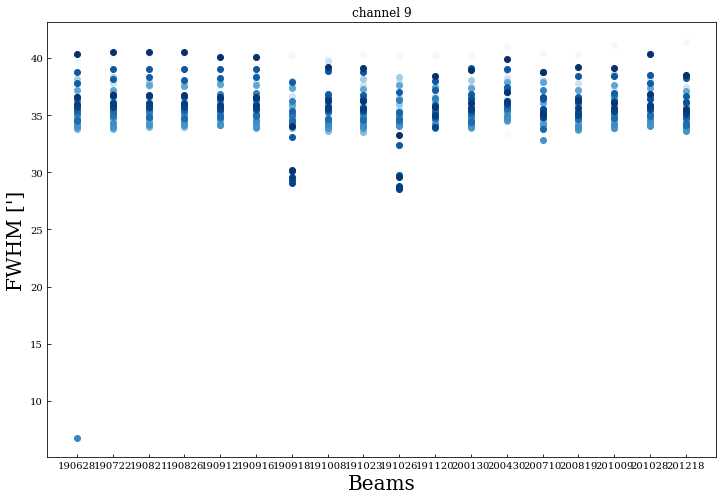

In [128]:
# plot FWHM for all beams at different dates
# loop troug all frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '191008', '191023', '191120', '200130', '200430', '200710', '200819', '201009']
beam = 24
pol= 'I'
channel = 5

n = 40
colors = mpl.cm.Blues(np.linspace(0,1,n))

fig = plt.figure( figsize=(12, 8))
ax = fig.add_subplot(111)
ax.set_title('channel 9')

with open('/tank/apertif/driftscans/fits_files/average_FWHM_{}_chan_{}.csv'.format(pol, channel), mode='w') as fwhm_file:
    fwhm_writer = csv.writer(fwhm_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    fwhm_writer.writerow(['Beam', 'FWHMs', 'FWHM_av', 'sigma', 'FWHM_av_noout', 'sigma_noout'])
            
    for beam in range(0,40):
        FWHM = []
        for date in dates:
            data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, channel), format='csv', fast_reader=False)
            FWHM.append(data['FWHM_av'][beam])
            ax.plot(date, data['FWHM_av'][beam], marker='o', color=colors[beam], label=date)

        ax.set_ylabel('FWHM [\']', fontsize=20)
        ax.set_xlabel('Beams', fontsize=20)
        #ax.set_ylim(25,50)
        #ax.legend(bbox_to_anchor=(1.03, 1.05)) 
        FWHM = np.array(FWHM)
        FWHM_1 =reject_outliers(FWHM, m=3)
        print('{} average FWHM:'.format(beam), round(np.average(FWHM),2), round(np.std(FWHM),2))
        fwhm_writer.writerow([beam, FWHM, np.average(FWHM), np.std(FWHM), np.average(FWHM_1), np.std(FWHM_1)] )

    plt.savefig('/tank/denes/drift_scan/plots/FWHMs_{}_chan{}.png'.format(pol, channel), bbox_inches="tight", dpi=200)


33.49878057093973 40.40756902117536 0.15468107893918964 6.4876333982571825 0.8167351284082951


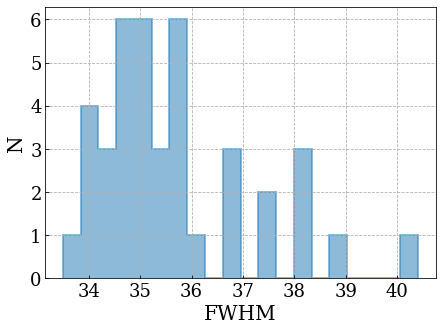

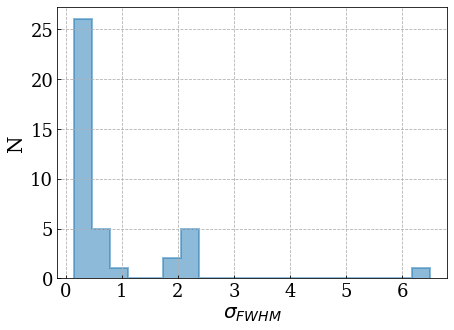

In [138]:
pol = 'I'
channel = 5
data = ascii.read('/tank/apertif/driftscans/fits_files/average_FWHM_{}_chan_{}.csv'.format(pol, channel))

#print(data[39]['FWHMs'])

dat = np.array(data['FWHM_av'])
sig = np.array(data['sigma'])
print(np.min(dat), np.max(dat), np.min(sig), np.max(sig), np.mean(sig))

fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])
bins=20
#bins = np.arange(-8e-8,-1e-8,0.2e-8)

ax = fig.add_subplot(1,1,1)
ax.grid(True, linestyle='--')
plt.hist(dat, bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
#ax.axvline(np.mean(a_1), color='C0')
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('FWHM', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
#plt.legend(fontsize=20)

plt.savefig('/tank/denes/drift_scan/plots/hist_FWHMs_{}.png'.format(pol), bbox_inches='tight', dpi=200)

fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])
bins=20

ax = fig.add_subplot(1,1,1)
ax.grid(True, linestyle='--')
plt.hist(sig, bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
#ax.axvline(np.mean(a_1), color='C0')
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel(r'$\sigma_{FWHM}$', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
#plt.legend(fontsize=20)

plt.savefig('/tank/denes/drift_scan/plots/hist_FWHM_sigma_{}.png'.format(pol), bbox_inches='tight', dpi=200)

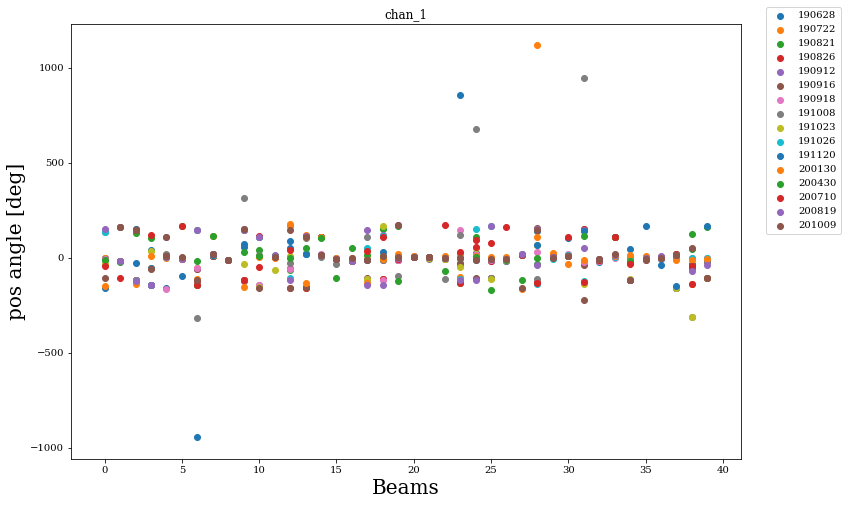

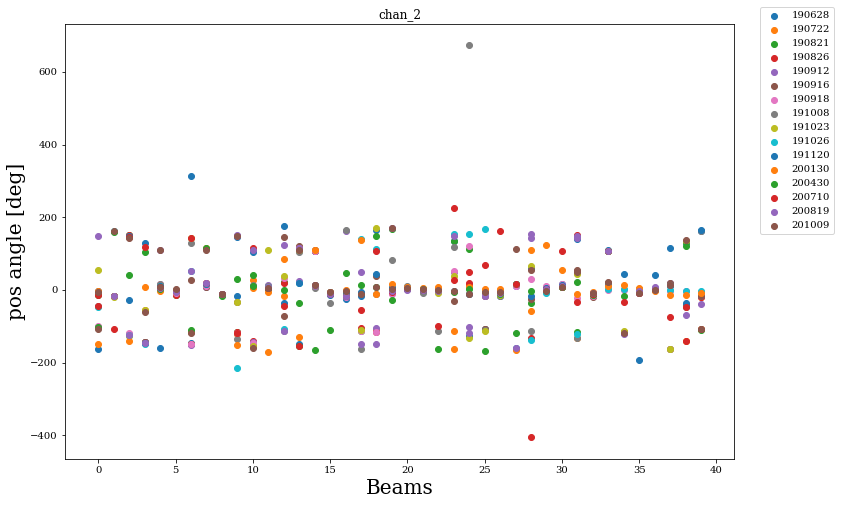

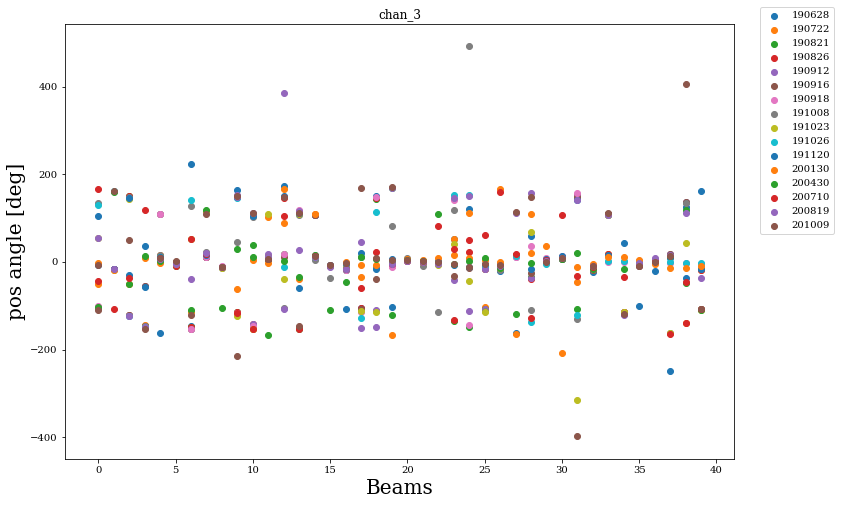

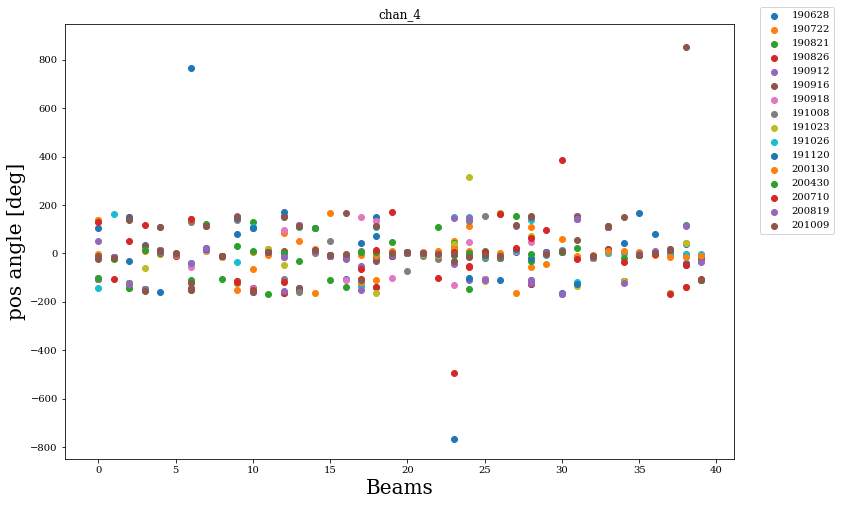

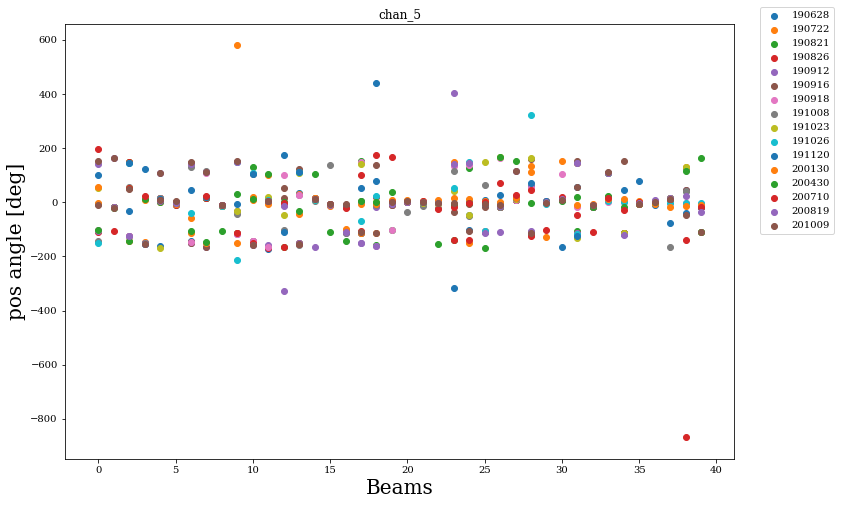

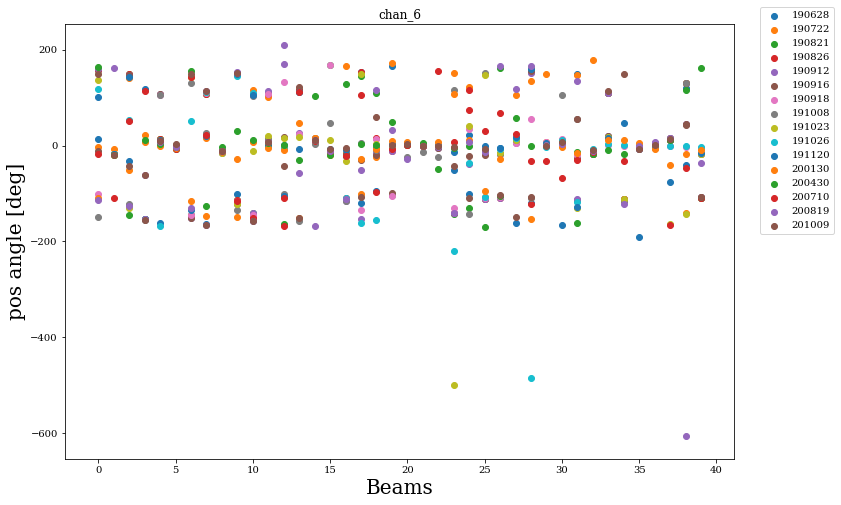

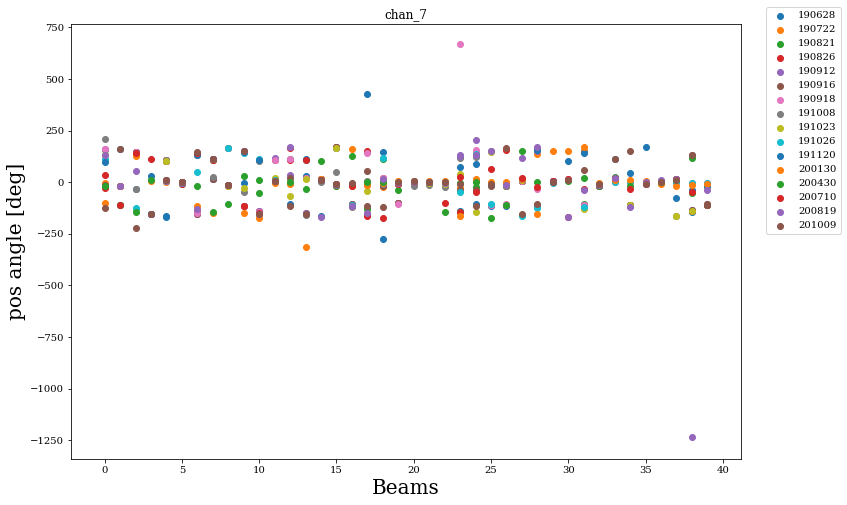

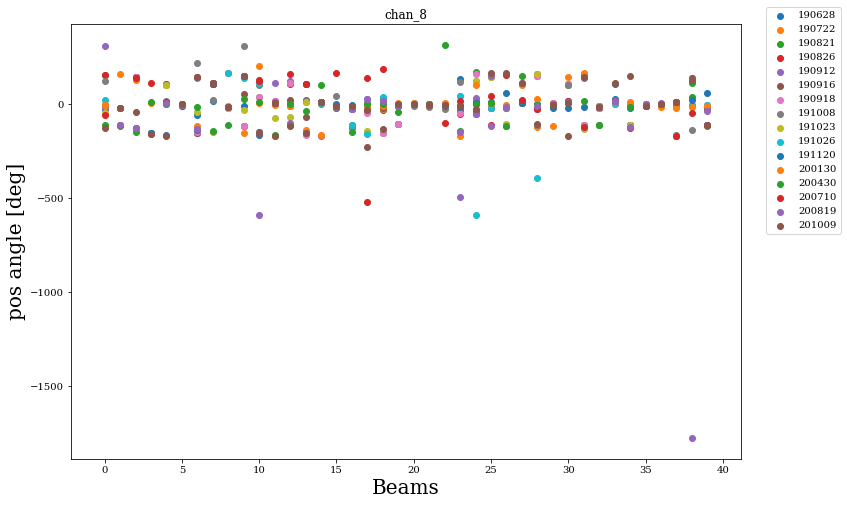

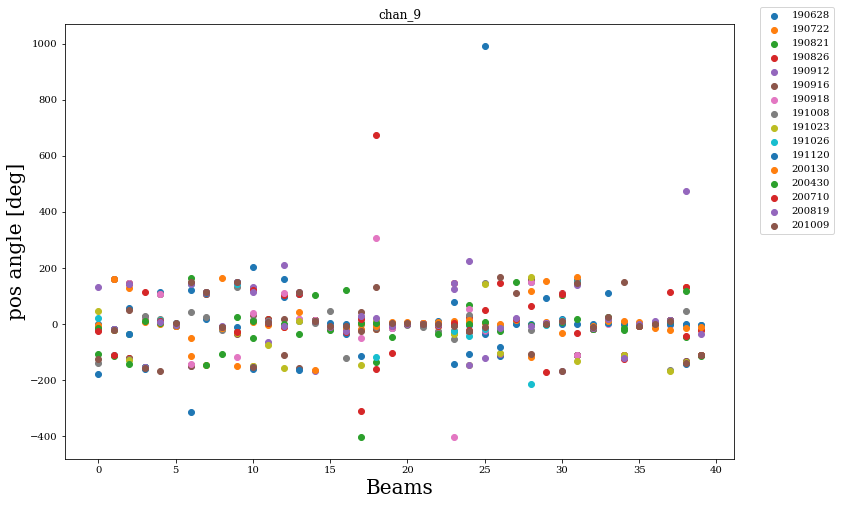

In [14]:
# plot position angle for all beams at different dates
# loop troug all frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '191008', '191023', '191120', '200130', '200430', '200710', '200819', '201009']
freq = '7'

for freq in range(1,10):
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(111)
    ax.set_title('chan_{}'.format(freq))
    for date in dates:
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        pos_angle = np.array(data['pos_angle'])
        for j in range(len(pos_angle)):
            if pos_angle[j] > 180:
                pos_angle[j] = (360 - pos_angle[j]) * -1
            if pos_angle[j] < - 180:
                pos_angle[j] = 360 + pos_angle[j]
        ax.scatter(range(40), pos_angle, label=date)

    ax.set_ylabel('pos angle [deg]', fontsize=20)
    ax.set_xlabel('Beams', fontsize=20)
    #ax.set_ylim(25,50)
    ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.savefig('/tank/denes/drift_scan/plots/pos_angle_chan_{}.png'.format(freq), bbox_inches="tight", dpi=200)


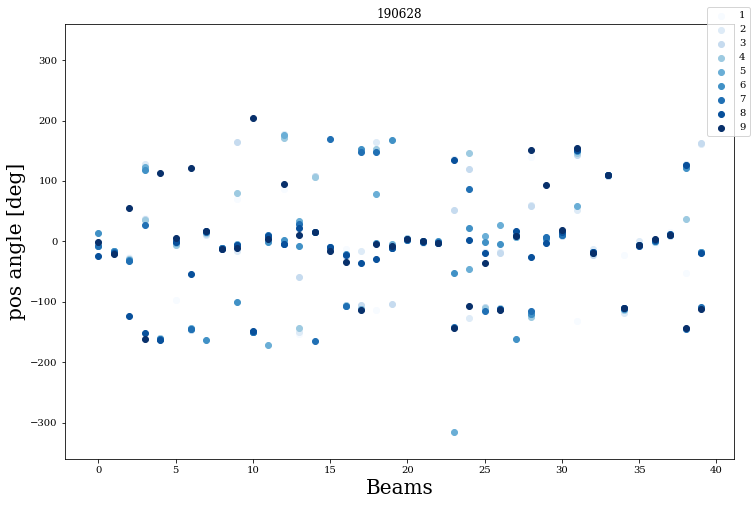

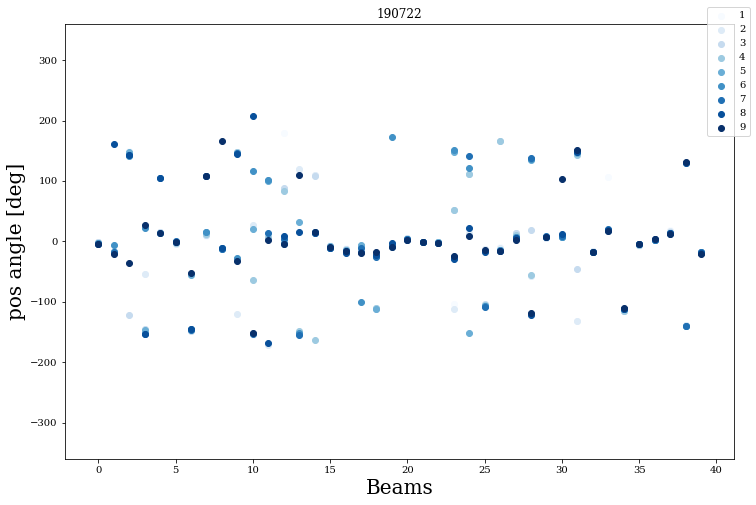

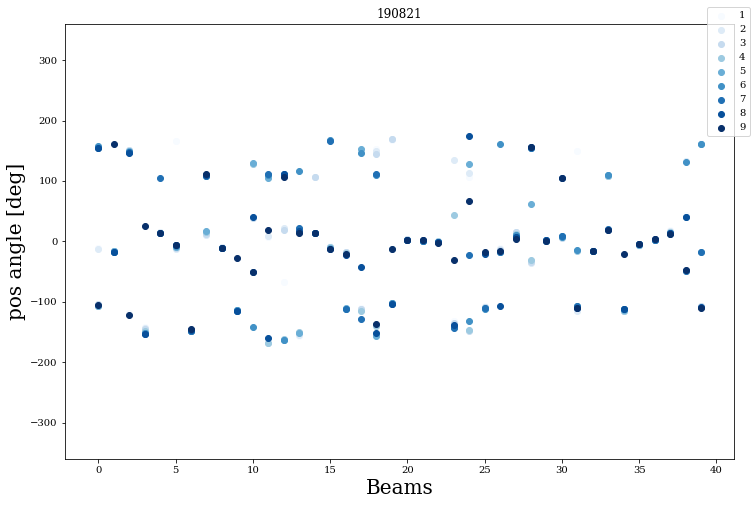

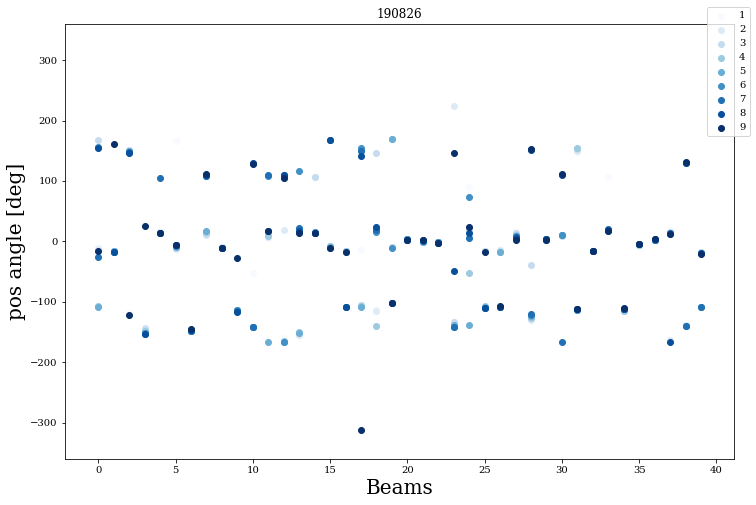

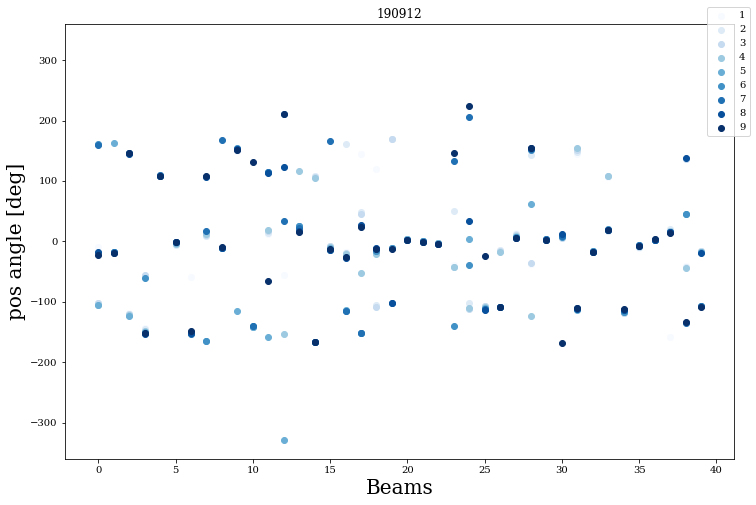

...

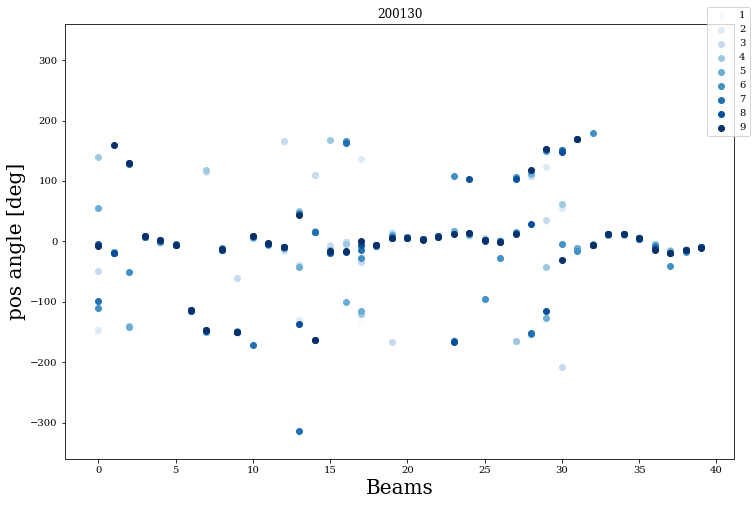

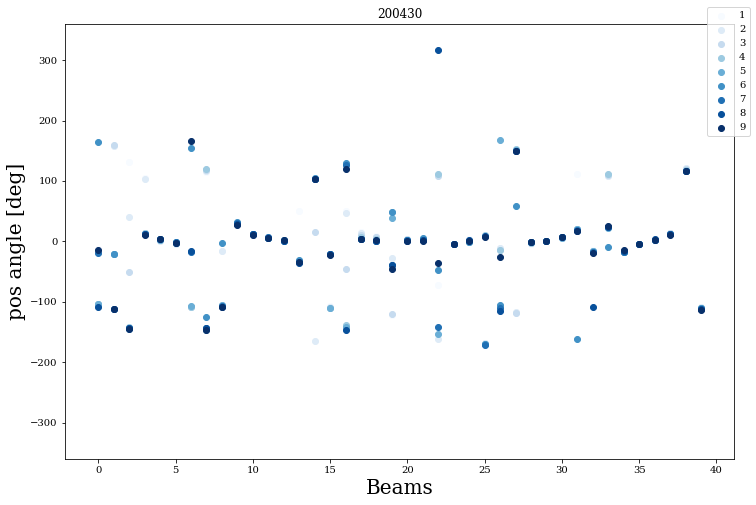

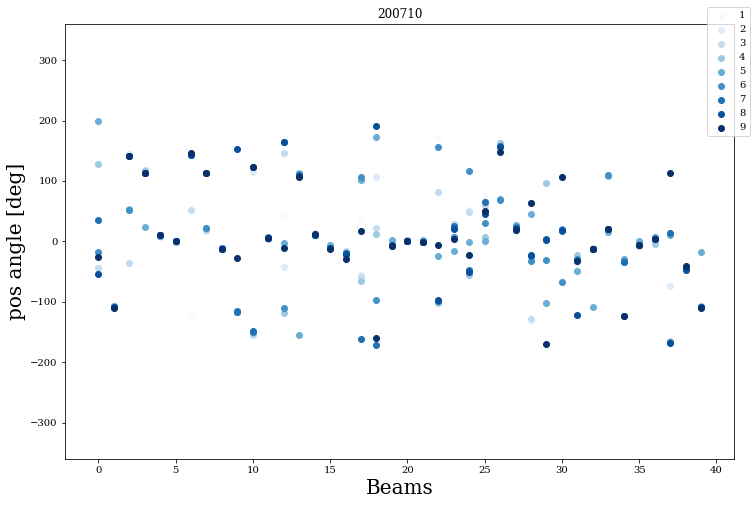

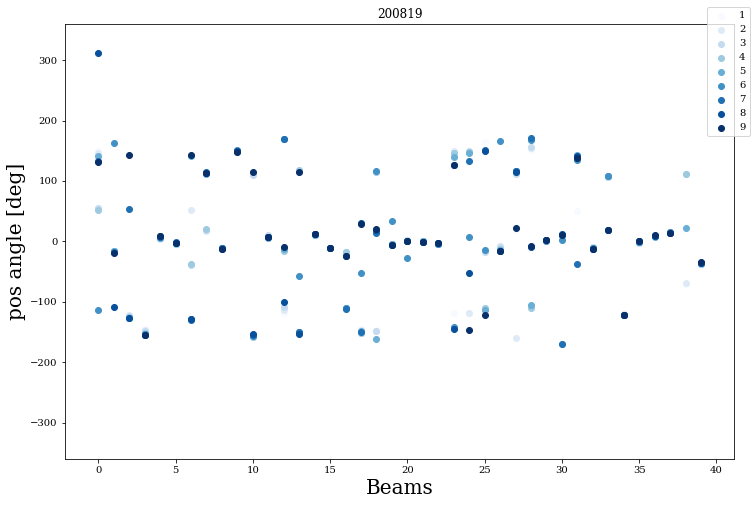

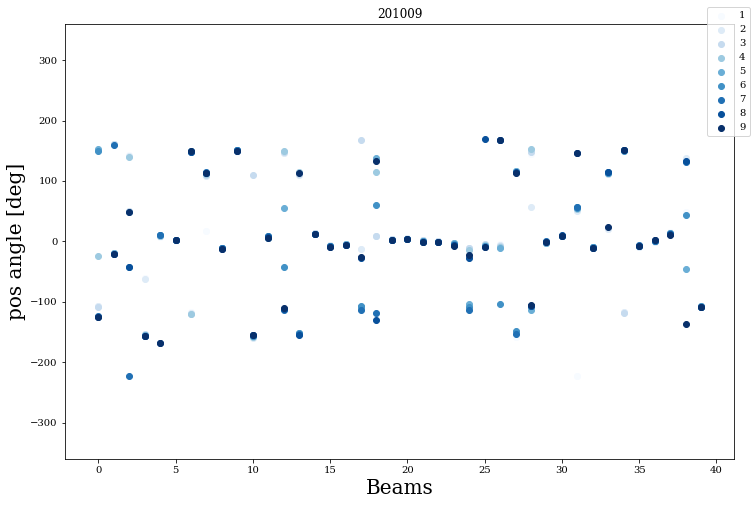

In [13]:
# plot position angle for all beams at different frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']


n = 9
colors = mpl.cm.Blues(np.linspace(0,1,n))

for date in dates:
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(111)
    ax.set_title(date)
    for freq in range(1,10):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        pos_angle = np.array(data['pos_angle'])
        for j in range(len(pos_angle)):
            if pos_angle[j] > 180:
                pos_angle[j] = (360 - pos_angle[j]) * -1
            if pos_angle[j] < - 180:
                pos_angle[j] = 360 + pos_angle[j]
        ax.scatter(range(40), pos_angle, label=freq, color=colors[freq-1])

    ax.set_ylabel('pos angle [deg]', fontsize=20)
    ax.set_xlabel('Beams', fontsize=20)
    ax.set_ylim(-360,360)
    ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_pos_angle.png'.format(date), bbox_inches="tight", dpi=200)


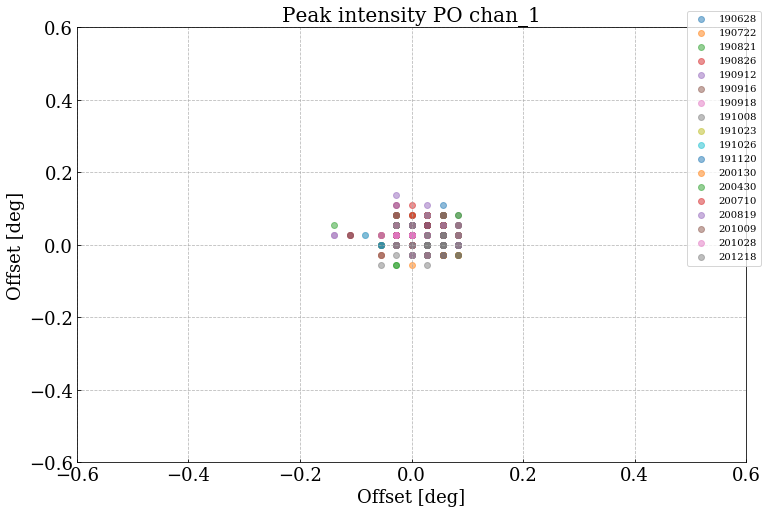

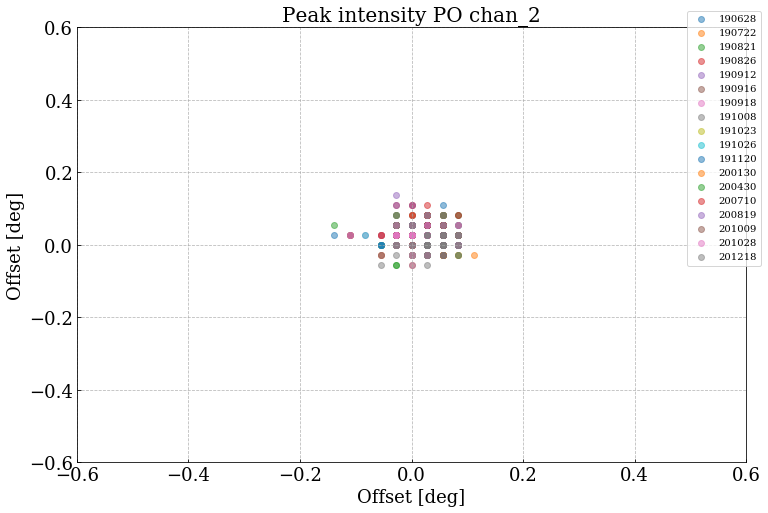

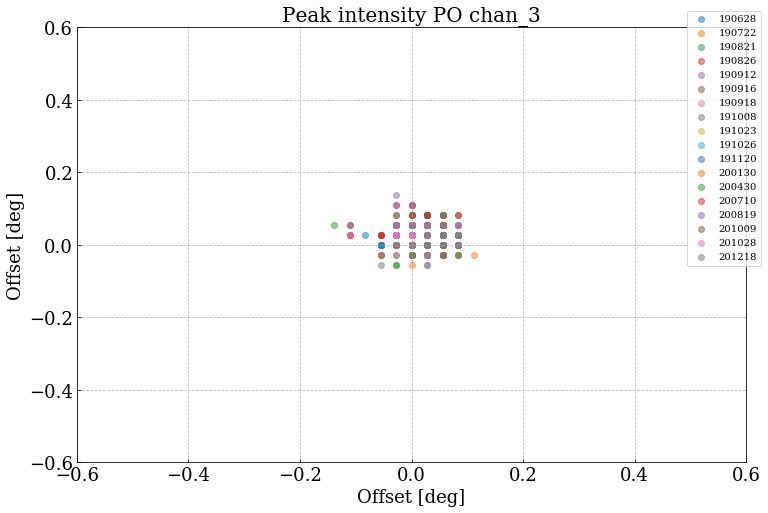

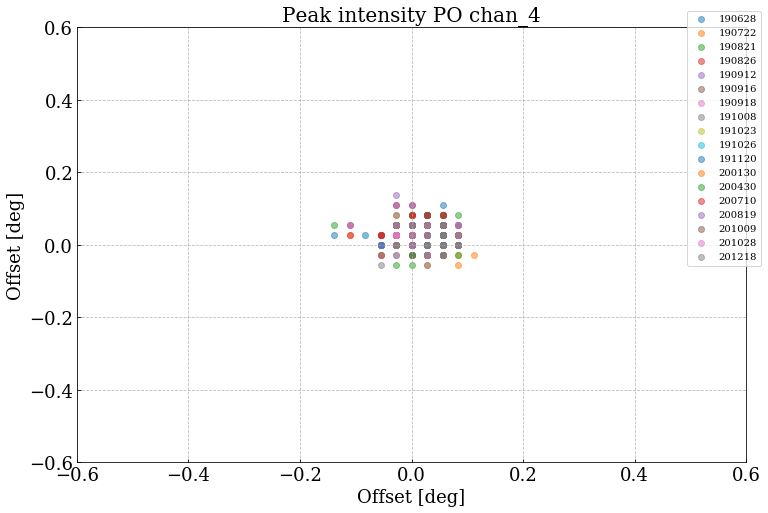

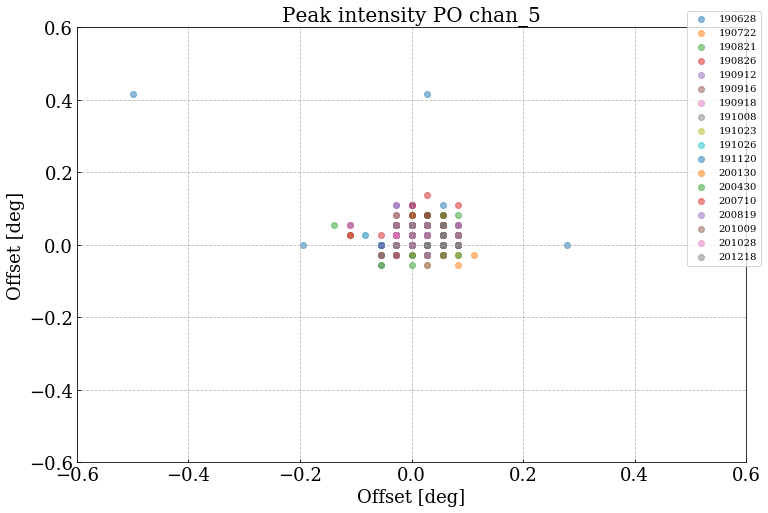

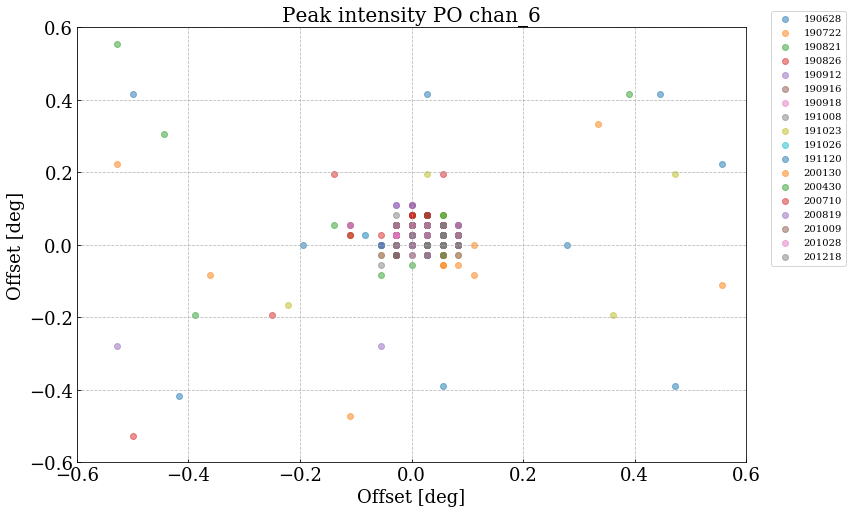

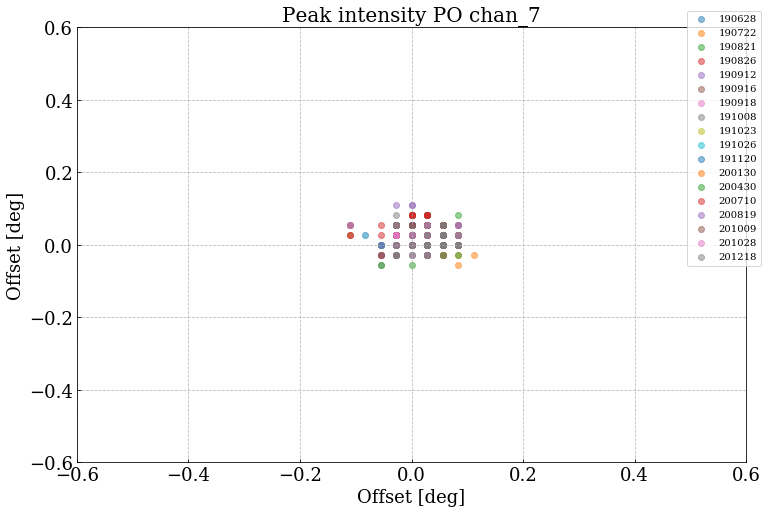

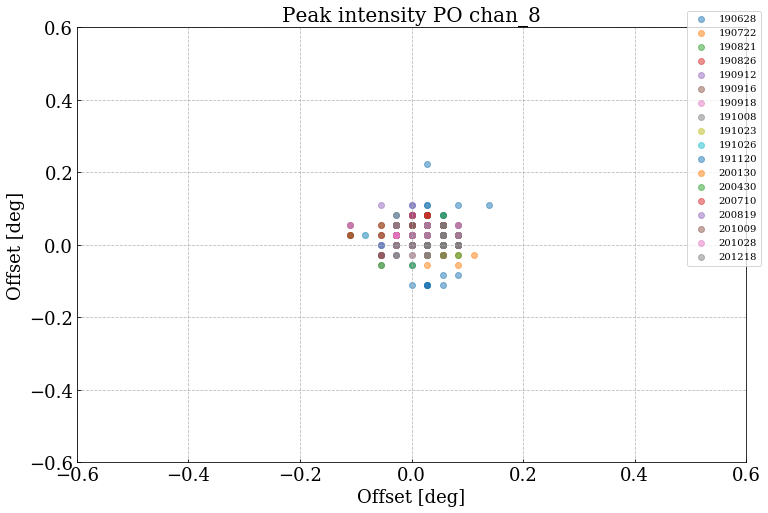

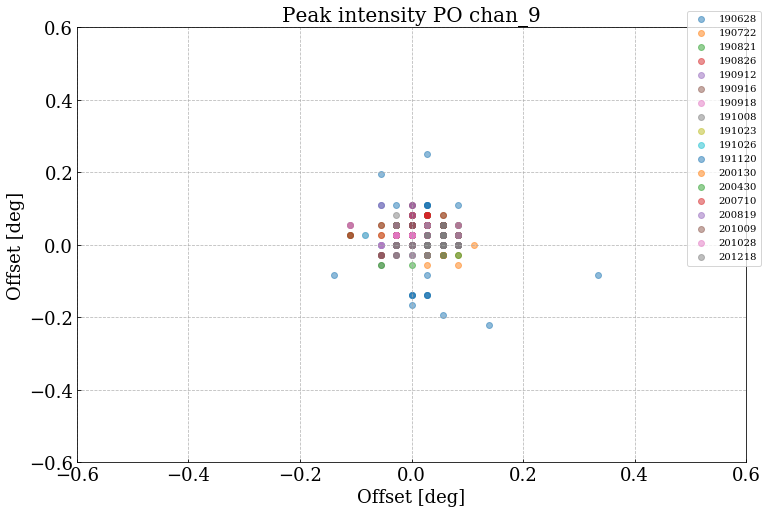

In [65]:
# plot x0, y0 for all beams at different dates
# loop troug all frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '191008', '191023', '191120', '200130', '200430', '200710', '200819', '201009']
freq = '7'

n = len(dates)
colors = mpl.cm.viridis(np.linspace(0,1,n))

for freq in range(1,10):
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(111)
    ax.set_title('Peak intensity PO chan_{}'.format(freq), fontsize=20)
    plt.grid(linestyle='--', color='darkgrey', alpha=0.8)
    for i in range(len(dates)):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(dates[i], dates[i], freq), format='csv', fast_reader=False)

        cb = plt.scatter((20-data['x_0'])*(100. / 3600.), (20-data['y_0'])*(100. / 3600.), alpha=0.5, label=dates[i])

    ax.set_xlim(-0.6,0.6)
    ax.set_ylim(-0.6,0.6)
    ax.set_xlabel('Offset [deg]', size=18)
    ax.set_ylabel('Offset [deg]', size=18)
    ax.tick_params(axis='both', which='major', labelsize=18)

    #cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    #cbar =fig.colorbar(cb, cax=cbar_ax)
    #cbar.minorticks_on()
    #cbar.set_label('Beams', size=15)
    #cbar.ax.tick_params(labelsize=18) 
    ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.savefig('/tank/denes/drift_scan/plots/Peak_offset_chan_{}_blue.png'.format(freq), bbox_inches="tight", dpi=200)



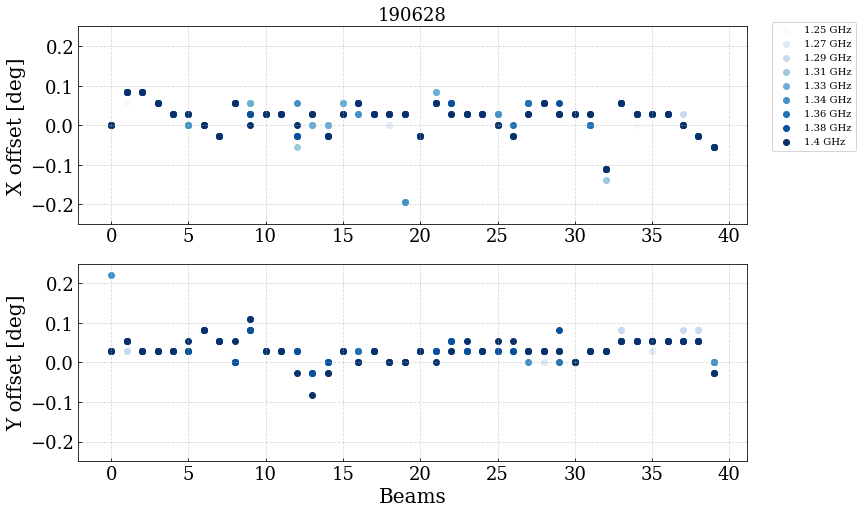

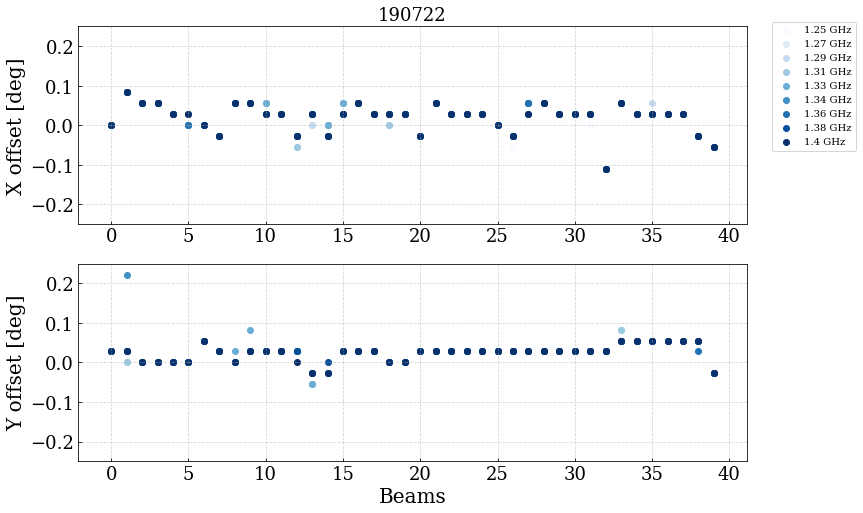

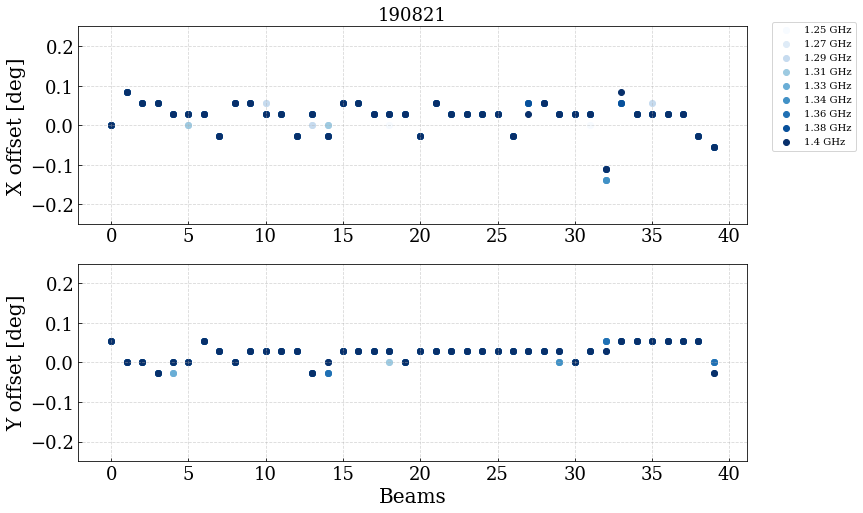

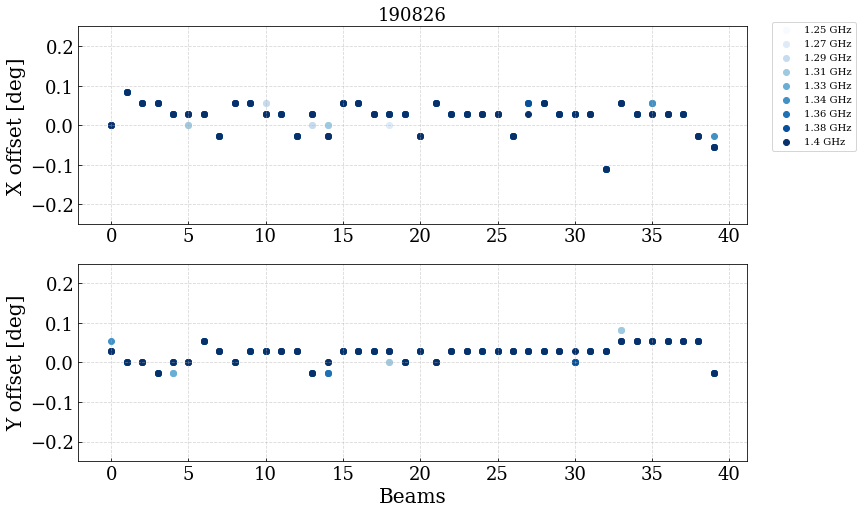

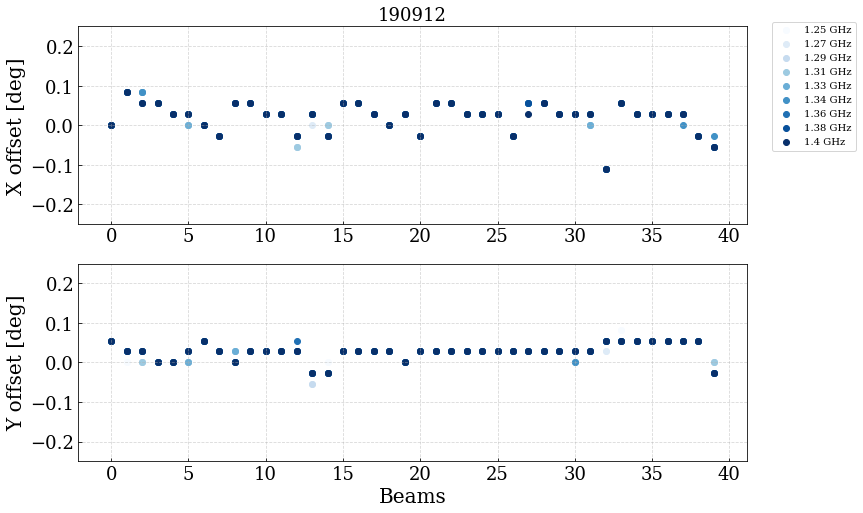

...

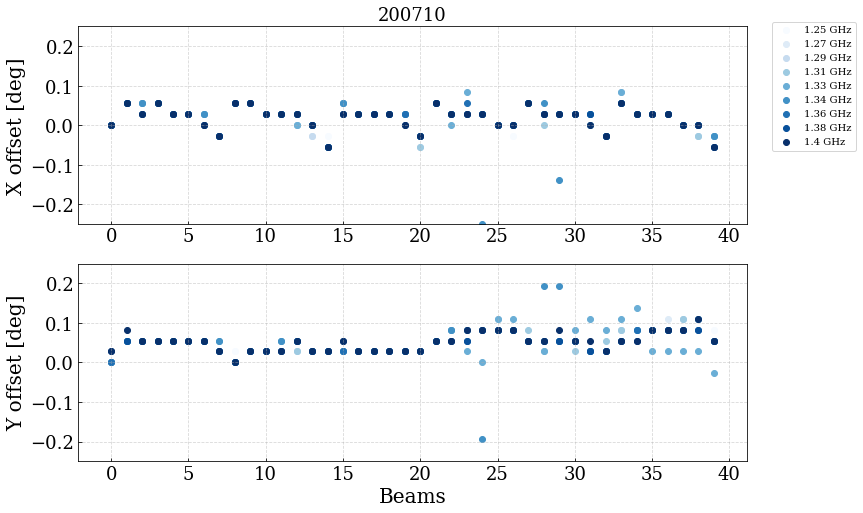

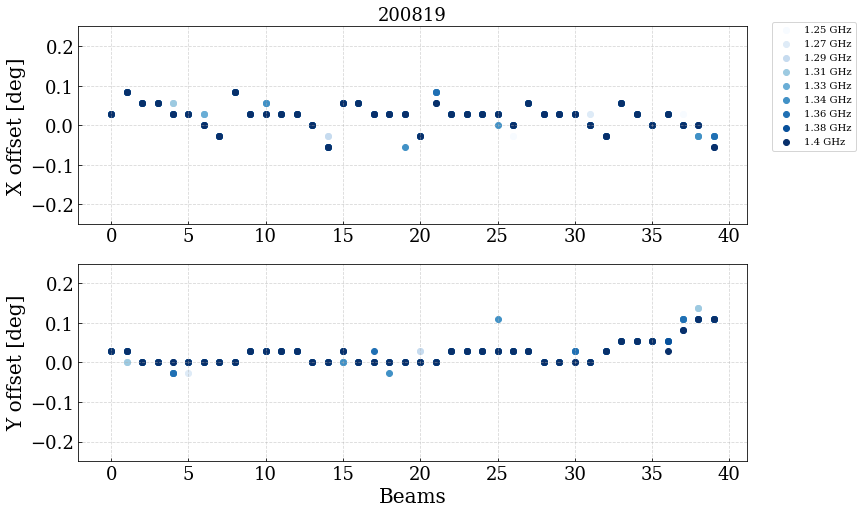

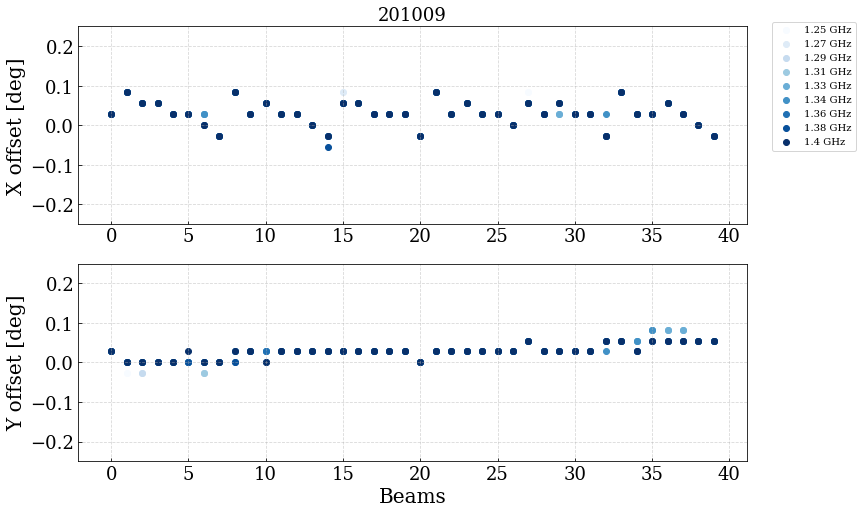

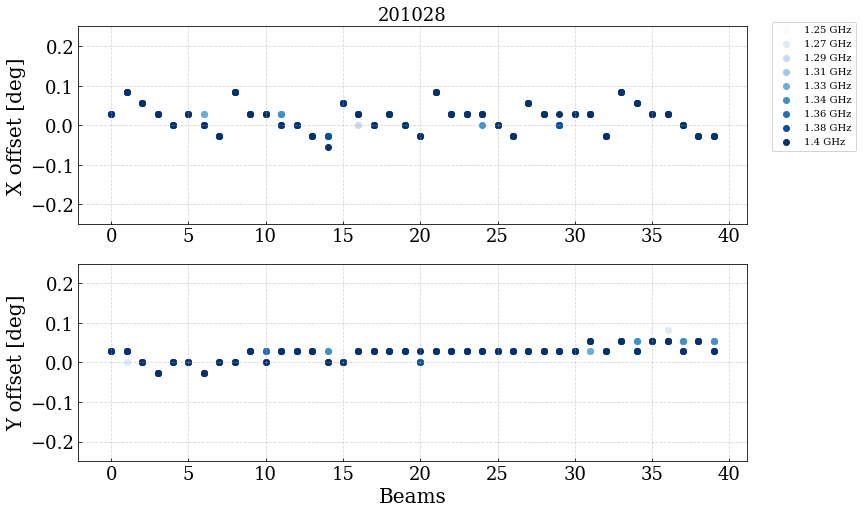

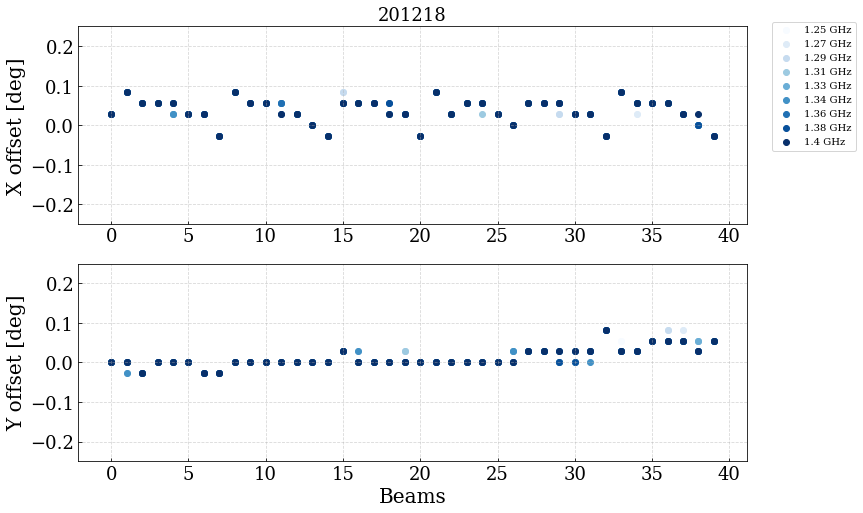

In [67]:
# plot position angle for all beams at different frequencies

dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
freq_label = np.array([1234867750.0, 1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0, 1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0])
freq_label_gh = np.round(freq_label/1e9,2)

n = 9
colors = mpl.cm.Blues(np.linspace(0,1,n))

for date in dates:
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(211)
    ax.set_title(date, fontsize=18)
    for freq in range(1,10):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        x_off = (20-data['x_0'])*(100. / 3600.)
        ax.scatter(range(40), x_off, label='{} GHz'.format(freq_label_gh[freq]), color=colors[freq-1])

    ax.set_ylabel('X offset [deg]', fontsize=20)
    #ax.set_xlabel('Beams', fontsize=20)
    ax.set_ylim(-0.25,0.25)
    #ax.set_ylim(-0.6,0.6)
    ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.grid(linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
    ax = fig.add_subplot(212)
    for freq in range(1,10):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        y_off = (20-data['y_0'])*(100. / 3600.)
        ax.scatter(range(40), y_off, label=freq, color=colors[freq-1])

    ax.set_ylabel('Y offset [deg]', fontsize=20)
    ax.set_xlabel('Beams', fontsize=20)
    ax.set_ylim(-0.25,0.25)
    #ax.set_ylim(-0.6,0.6)
    plt.grid(linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
    plt.savefig('/tank/denes/drift_scan/plots/{}_xy_off.png'.format(date), bbox_inches="tight", dpi=200)


# Frequency dependence

[39.87892517 39.49360335 39.11565646 38.74487477 38.38105643 38.02400711
 37.67353965 37.3294737  36.99163547]
line parameters for theory:  -2.70216842388898e-08 73.75169297447796
I -2.8801461371579675e-08 75.1672407859401
I [-2.8801461371579675e-08] [75.1672407859401]
[39.87892517 39.49360335 39.11565646 38.74487477 38.38105643 38.02400711
 37.67353965 37.3294737  36.99163547]
line parameters for theory:  -2.70216842388898e-08 73.75169297447796
xx -2.8331604854064116e-08 74.33895651115682
xx [-2.8331604854064116e-08] [74.33895651115682]
[39.87892517 39.49360335 39.11565646 38.74487477 38.38105643 38.02400711
 37.67353965 37.3294737  36.99163547]
line parameters for theory:  -2.70216842388898e-08 73.75169297447796
yy -2.9522978621379398e-08 76.07464875629076
yy [-2.9522978621379398e-08] [76.07464875629076]


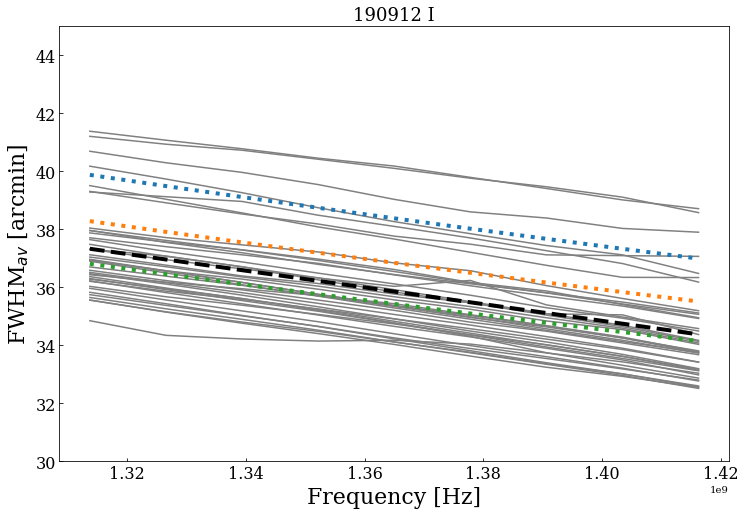

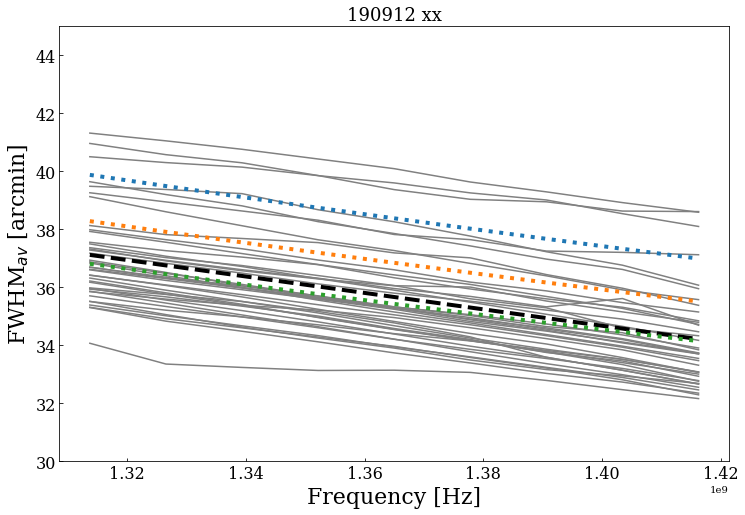

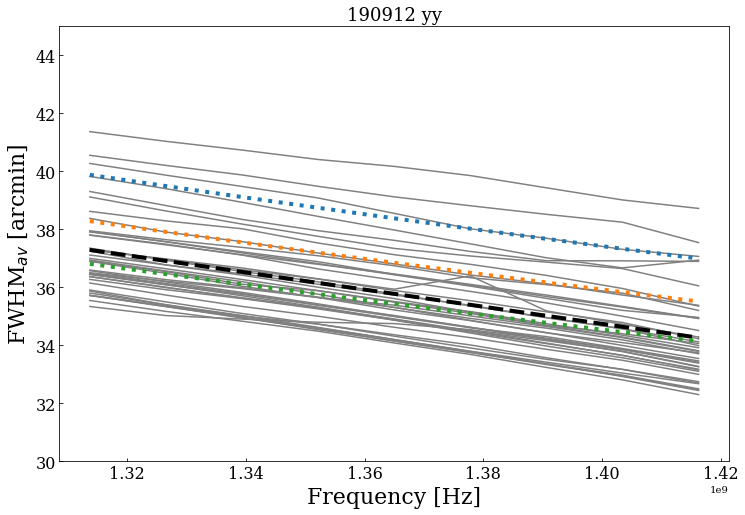

In [19]:
#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009']
#dates = ['190628', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
dates = ['190912']

for pol in ['I', 'xx', 'yy']:
    a_av = []
    b_av = []

    for date in dates:
        data_2 = []
        
        with open('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol), mode='w') as fwhm_file:
            fwhm_writer = csv.writer(fwhm_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
            fwhm_writer.writerow(['Beam', 'a', 'b'])

            for freq in range(1,10):
                data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_{}_{}.csv'.format(date, date, pol, freq), format='csv', fast_reader=False)
                #print(data.keys())
                data_2.append(data['FWHM_av'])

            fig = plt.figure( figsize=(12, 8))
            ax = fig.add_subplot(111)
            plt.title('{} {}'.format(date, pol), fontsize=18)

            #freq1 = range(0,9)
            #freq1 = [1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0,1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0]
            freq1 = []
            CRVAL3_new = 1280e6+(12.207e3*(-(24576/2-14000)))  #rewrite to this
            CDELT3_new = 12.207e3*1050
            for i in range(1,10):
                freq1.append(CRVAL3_new+(i*CDELT3_new))

            a = []
            b = []

            for beam in range(0,40):
                fwhm = []
                for freq in range(0,9):
                    fwhm.append(data_2[freq][beam])

                par = np.polyfit(freq1, fwhm, 1)
                a.append(par[0])
                b.append(par[1])
                ax.plot(freq1, fwhm, '-', color='grey')
                fwhm_writer.writerow([beam, par[0], par[1]] )
                
            line = np.array(freq1)*np.mean(a) + np.mean(b)
            a_av.append(np.mean(a))
            b_av.append(np.mean(b))
            
            line2 = 1.22 * 299792458/np.array(freq1)/24 * 57.296 *60
            line3 = 1.22 * 299792458/np.array(freq1)/25 * 57.296 *60
            line4 = 1.22 * 299792458/np.array(freq1)/26 * 57.296 *60
            print(line2)
            par2 = np.polyfit(freq1, line3, 1)
            print('line parameters for theory: ',par2[0], par2[1])

            ax.plot(freq1, line, '--', color='k', linewidth=4)
            ax.plot(freq1, line2, ':', color='C0', linewidth=4)
            ax.plot(freq1, line3, ':', color='C1', linewidth=4)
            ax.plot(freq1, line4, ':', color='C2', linewidth=4)
            ax.tick_params(axis='both', which='major', labelsize=16)
            plt.xlabel('Frequency [Hz]', fontsize=22)
            plt.ylabel('FWHM$_{av}$ [arcmin]', fontsize=22)
            #plt.text(1.31e9,42.5,'a={}'.format(np.round(np.mean(a)*10**8,2))+'x10$^{-8}$,'+' b={}'.format(np.round(np.mean(b),2)), fontsize=18)
            ax.set_ylim(30,45)
            #ax.legend()
            plt.savefig('/tank/denes/drift_scan/plots/{}_size_freq_{}.png'.format(date, pol), bbox_inches="tight", dpi=200)
            
    print(pol, np.mean(a_av), np.mean(b_av))
    print(pol, a_av, b_av)


In [18]:
date = '190628'
pol = 'xx'
data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol))

In [32]:
data['a']

-6.298374882327206e-08
-2.186153754164743e-08
-2.598549166303537e-08
-2.820103917594503e-08
-3.12025995218912e-08
-3.135663647081638e-08
-2.636284524403179e-08
-3.0449743133094173e-08
-3.63493708359595e-08
-3.825235115615728e-08
-3.247673237556365e-08


16
I a,b: -3.0 0.6 76.7 8.2
I a,b: -3.0 0.6 76.7 8.2
xx a,b: -3.0 0.7 77.0 9.2
xx a,b: -3.0 0.7 77.0 9.2
yy a,b: -2.7 9.0 72.5 115.9
yy a,b: -3.0 0.6 77.1 8.4


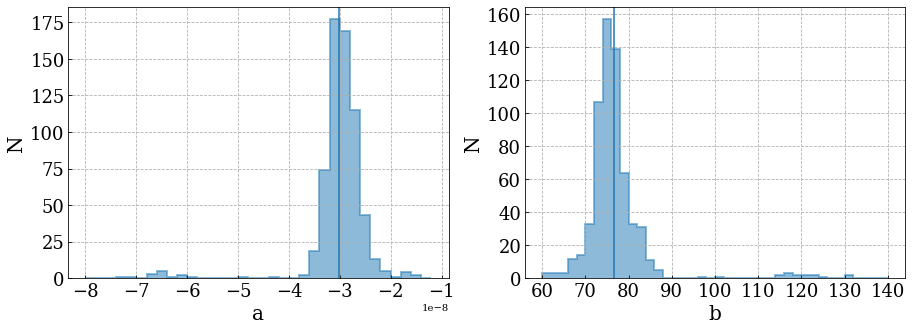

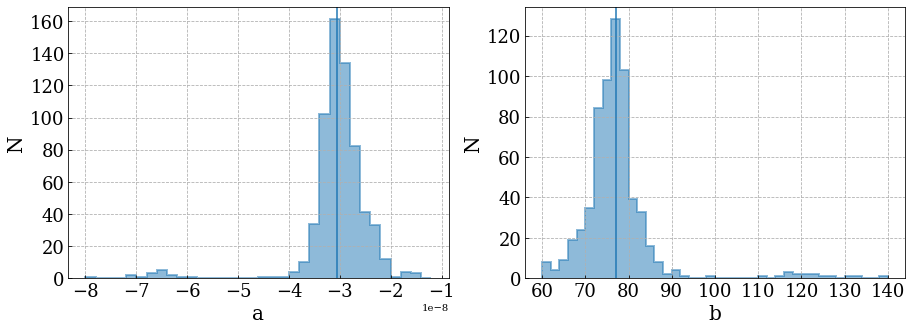

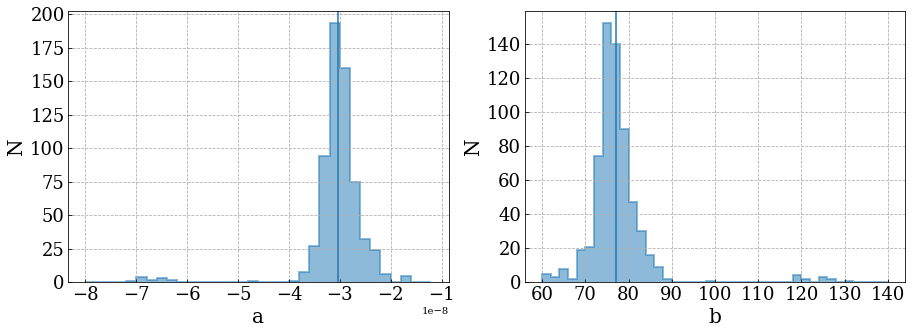

In [96]:
def reject_outliers(data, m=2):
    return data[abs(data - np.mean(data)) < m * np.std(data)]

dates = ['190628', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
print(len(dates))

#pol = 'I'
for pol in ['I', 'xx', 'yy']:
    a = np.empty(0)
    b = np.empty(0)

    for date in dates:
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol))
        a_0 = np.array(data['a'])
        b_0 = np.array(data['b'])
        a = np.concatenate((a, a_0))
        b = np.concatenate((b, b_0))
        


    print('{} a,b:'.format(pol),np.round(np.mean(a)/10**(-8),1), np.round(np.std(a)/10**(-8),1), np.round(np.mean(b),1), np.round(np.std(b),1))
    
    a_1 =reject_outliers(a, m=10)
    b_1 =reject_outliers(b, m=10)
    
    print('{} a,b:'.format(pol), np.round(np.mean(a_1)/10**(-8),1), np.round(np.std(a_1)/10**(-8),1), np.round(np.mean(b_1),1), np.round(np.std(b_1),1))

    fig = plt.figure(figsize=(15.,5.))
    plt.axes(frameon=False)
    plt.xticks([])
    plt.yticks([])
    #bins=20
    bins = np.arange(-8e-8,-1e-8,0.2e-8)

    ax = fig.add_subplot(1,2,1)
    ax.grid(True, linestyle='--')
    plt.hist(a, bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
    ax.axvline(np.mean(a_1), color='C0')
    plt.xticks(family='serif',size=18)
    plt.yticks(family='serif',size=18)
    #ax.set_ybound(0, 20)
    ax.set_xlabel('a', size=20,family='serif')
    ax.set_ylabel('N', size=20,family='serif')
    #plt.legend(fontsize=20)

    bins = np.arange(60, 141, 2)

    ax = fig.add_subplot(1,2,2)
    ax.grid(True, linestyle='--')
    plt.hist(b, bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
    ax.axvline(np.mean(b_1), color='C0')
    plt.xticks(family='serif',size=18)
    plt.yticks(family='serif',size=18)
    #ax.set_ybound(0, 20)
    ax.set_xlabel('b', size=20,family='serif')
    ax.set_ylabel('N', size=20,family='serif')
    #plt.legend(fontsize=20)

    plt.savefig('/tank/denes/drift_scan/plots/hist_parameters_{}.png'.format(pol), bbox_inches='tight', dpi=200)

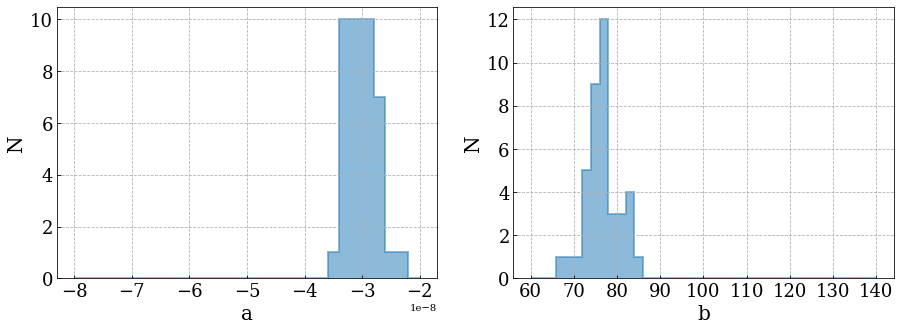

In [66]:
date = '201218'
pol = 'I'
data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol))

fig = plt.figure(figsize=(15.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])
bins = np.arange(-8e-8,-2e-8,0.2e-8)

ax = fig.add_subplot(1,2,1)
ax.grid(True, linestyle='--')
plt.hist(data['a'], bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('a', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
#plt.legend(fontsize=20)

bins = np.arange(60, 141, 2)

ax = fig.add_subplot(1,2,2)
ax.grid(True, linestyle='--')
plt.hist(data['b'], bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('b', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
#plt.legend(fontsize=20)

plt.savefig('/tank/denes/drift_scan/plots/{}_parameters_v1.png'.format(date), bbox_inches='tight', dpi=200)

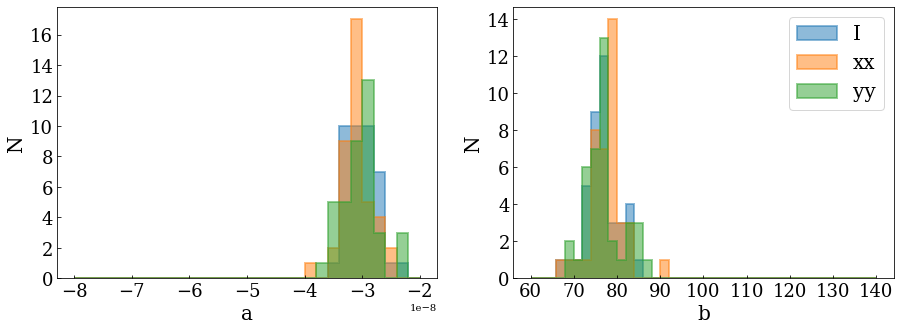

In [67]:
date = '201218'
#pol = 'xx'

fig = plt.figure(figsize=(15.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

bins = np.arange(-8e-8,-2e-8,0.2e-8)

ax = fig.add_subplot(1,2,1)
for pol in ['I','xx', 'yy']:
    data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol))
    plt.hist(data['a'], bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))

plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('a', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
#plt.legend(fontsize=20)

bins = np.arange(60, 141, 2)

ax = fig.add_subplot(1,2,2)
for pol in ['I','xx', 'yy']:
    data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM-freq_{}_{}.csv'.format(date, date, pol))
    plt.hist(data['b'], bins=bins, histtype='step', Fill=True, alpha=0.5, linewidth=2, label='{}'.format(pol))

plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('b', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')
plt.legend(fontsize=20)

plt.savefig('/tank/denes/drift_scan/plots/{}_parameters.png'.format(date), bbox_inches='tight', dpi=200)

In [134]:
freq1 = []
CRVAL3_new = 1280e6+(12.207e3*(-(24576/2-14000)))  #rewrite to this
CDELT3_new = 12.207e3*1050
for i in range(1,10):
    freq1.append(CRVAL3_new+(i*CDELT3_new))
    
print(np.array(freq1)/1000000000)

[1.31371573 1.32653308 1.33935043 1.35216778 1.36498513 1.37780248
 1.39061983 1.40343718 1.41625453]
